#TP2 - Ejercicio 2


El presente código se centra en el análisis de señales periféricas registradas a través de la *wristband* Empatica E4. En particular, se estudiarán la impedancia galvánica de la piel (o GSR, por sus siglas en inglés) y la variabilidad de la frecuencia cardíaca (HRV) basada en registros de fotopletismografía (PPG).

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Bibliotecas a importar

import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from scipy.signal import sosfiltfilt, butter, find_peaks, lfilter
import scipy.signal as sig

Se recuperan de la carpeta de Google Drive los nombres de las distintas carpetas donde se hallan los registros y los nombres de los archivos en formato csv que se encuentran en cada una de ellas.

In [ ]:
path='/content/drive/MyDrive/Archivos Facultad/Cuarto Año/1C/16.15 - Procesamiento de Señales Biomédicas/TP2/Ejercicio 2 - EDA y HRV'
carpetas=os.listdir(path)
archivos=[]

for i in range(8):
  if os.path.splitext(os.listdir(path+'/'+carpetas[0])[i])[1]=='.csv':
    archivos.append(os.path.basename(os.listdir(path+'/'+carpetas[0])[i]))

print(carpetas)
print(archivos)

['1663010921_A03963', '1663011571_A03963', '1663012191_A03963', '1663012819_A03963', '1663015880_A03963', '1663016481_A03963', '1663016975_A03963', '1663017358_A03963', '1663027487_A03963']
['BVP.csv', 'IBI.csv', 'tags.csv', 'ACC.csv', 'EDA.csv', 'HR.csv', 'TEMP.csv']


En particular, las señales de GSR, PPG y HRV están guardadas en los archivos EDA, BVP e IBI, respectivamente.

In [ ]:
# arch=['BVP.csv', 'EDA.csv', 'HR.csv']

PPG = []
GSR = []
IBI = []

for element in carpetas:
  PPG += [pd.read_csv(path+'/'+element+'/'+archivos[0])]
  GSR += [pd.read_csv(path+'/'+element+'/'+archivos[4])]
  try:
    IBI += [pd.read_csv(path+'/'+element+'/'+archivos[1])]
  except:
    IBI+=[]


Ahora que los registros han sido guardados en variables se debe corroborar cuál es el archivo que no fue tomado durante el horario de clase. 

En la primer fila de todos los archivos '.csv' se guarda el horario de comienzo del estudio en formato *unix timestamp* respecto del tiempo universal coordinado (UTC, por sus siglas en inglés). Este formato de tiempo guarda los segundos que ocurrieron desde el 1 de enero de 1970 respecto del horario central (Argentina está en -3).

La biblioteca Pandas toma este valor como el nombre de la columna en el que se guardaron los valores de las señales registradas.

Además, como todos los registros se tomaron en el mismo día solo varía el horario. 


In [ ]:
inicio=[]
for i in range(len(PPG)):
  inicio.append(int(float(PPG[i].columns[0])))

print(inicio)

horario=[]

for i in range(len(inicio)):
  n=inicio[i] # n esta en segundos
  segundos=int(n%60)
  n=(n-segundos)/60 # transformo n a minutos
  minutos=int(n%60)
  n=(n-minutos)/60-3 # transformo n a horas y resto 3 para pasar al horario de Argentina
  horas=int(n%24)
  if horas<0: horas+=24
  horario.append(str(horas).zfill(2)+':'+str(minutos).zfill(2)+':'+str(segundos).zfill(2))

print(horario)

[1663010921, 1663011571, 1663012191, 1663012819, 1663015880, 1663016481, 1663016975, 1663017358, 1663027487]
['16:28:41', '16:39:31', '16:49:51', '17:00:19', '17:51:20', '18:01:21', '18:09:35', '18:15:58', '21:04:47']


Todos los registros fueron tomados entre las 16 y las 19 horas, que es el horario de clase los lunes, salvo por el último que se tomó a las 21. Este registro no se analizará de ahora en adelante.

Además, dado que primero se tomaron registros durante el evento estresante y después durante el estado basal, y siendo que están ordenados por tiempo, los primeros cuatro registros son aquellos correspondientes al estado estresante mientras que los siguientes cuatro son los del estado basal. De modo que a continuación se separaron las señales según esta diferenciación.

In [ ]:
PPG_E=PPG[0:4]
PPG_B=PPG[4:8]
GSR_E=GSR[0:4]
GSR_B=GSR[4:8]

##Señales de GSR




En esta sección se procederá a analizar la señal de GSR. Inicialmente se crea una función para armar los vectores temporales de cada señal en base a su frecuencia de muestreo, determinada por el fabricante y publicada en el sitio web de Empatica. Estas serán 4 Hz para GSR y 64 Hz para PPG.

In [ ]:
#Armado de los vectores tiempo
def tiempos(fs,señal):
  tiempos=[];3
  for i in range(8):
    t = np.arange(0,señal[i].shape[0]/fs,1/fs)
    tiempos+=[t]
  return tiempos

In [ ]:
#Armado de tiempos para cada uno de los 8 GSR
fs_gsr = 4 
t_gsr=tiempos(fs_gsr,GSR)

Posteriormente, al observar los gráficos, se vio que es necesario eliminar las primeras dos muestras (1 segundo) porque en ellas aparece un pico impropio de la señal, debido probablemente a la instancia de calibración del equipo. Un ejemplo de dichos gráficos se halla a continuación. 

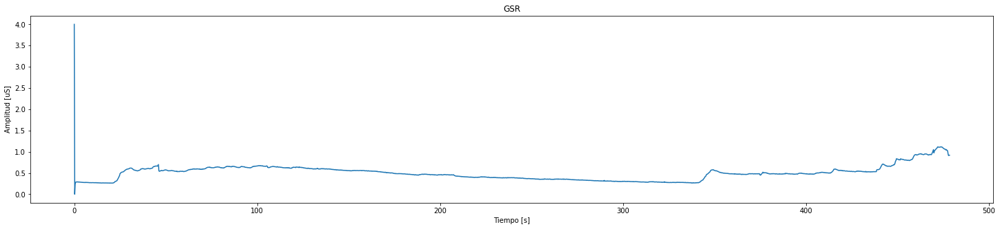

In [ ]:
plt.figure(figsize=(25,5))
plt.plot(t_gsr[0], GSR[0])
plt.title('GSR')
plt.ylabel('Amplitud [uS]')
plt.xlabel('Tiempo [s]')
plt.show()

In [ ]:
#Corte del primer segundo para deshacernos del pico
def crop(signal, tiempo, fs):
  s_cut = []
  t_cut = []
  for i in range(8):
    s_nueva = signal[i].values[fs:]
    t_nuevo = tiempo[i][fs:] 
    s_cut += [s_nueva]
    t_cut += [t_nuevo]
  return s_cut, t_cut

In [ ]:
GSR, t_gsr = crop(GSR, t_gsr, fs_gsr)

Sin ningún acondicionamiento más que el corte inicial, las señales se ven de la siguiente manera:

In [ ]:
#Plotea señales de GSR
def plot(t,señal,estudio,nom):
  for i in range(8):
    plt.figure(figsize=(25,5))
    plt.plot(t[i], señal[i])
    plt.title(estudio+' - Registro: '+nom[i])
    plt.ylabel('Amplitud [uS]')
    plt.xlabel('Tiempo [s]')
    plt.grid()
    plt.show()
    print('\n')

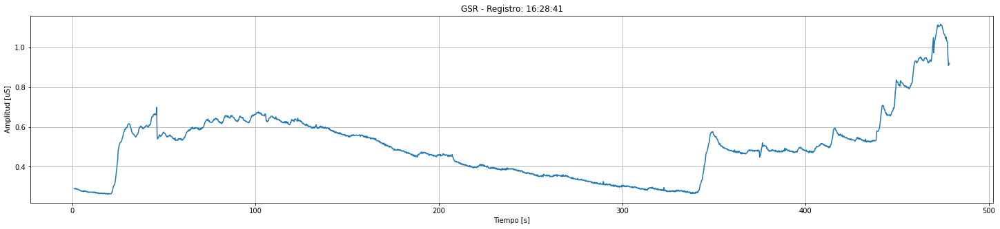

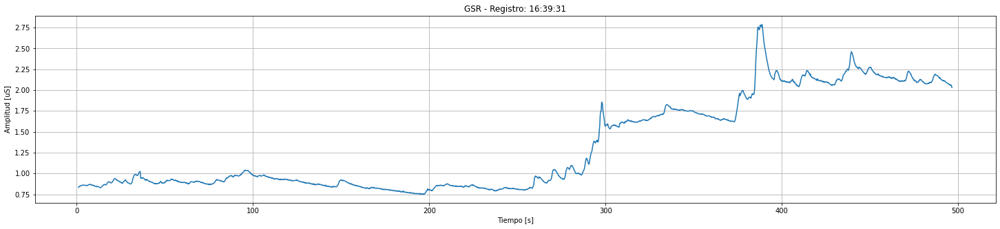

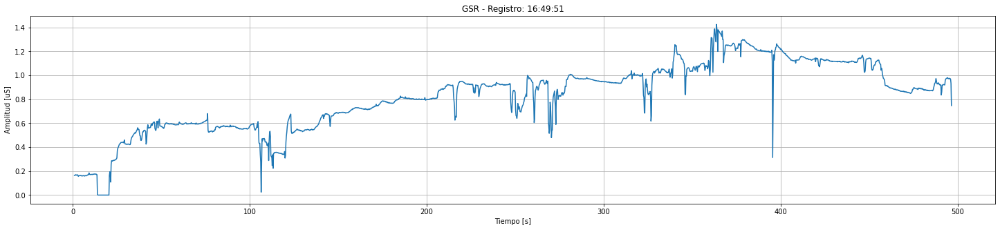

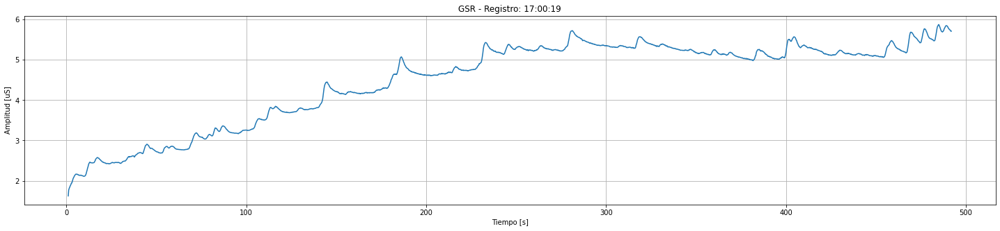

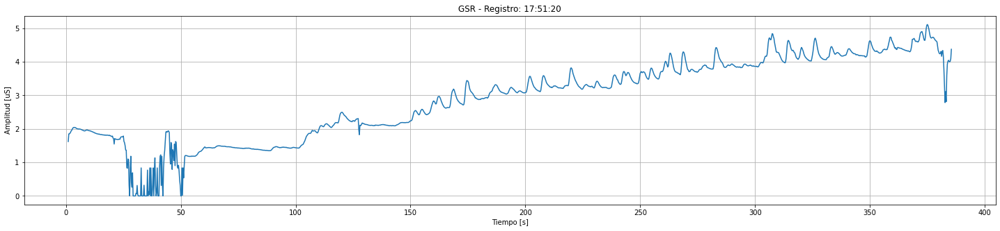

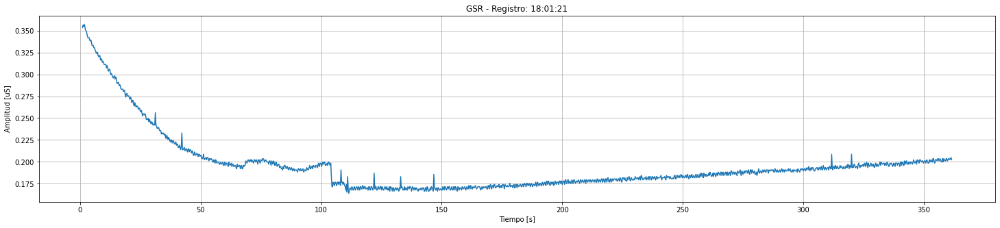

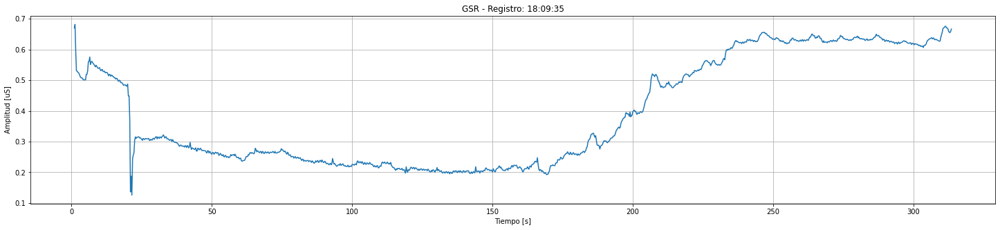

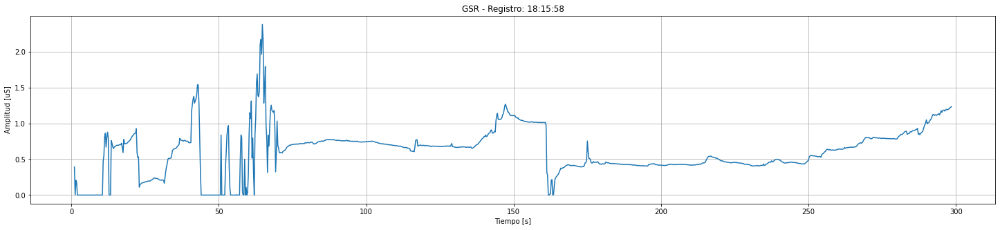

In [ ]:
#Ploteo inicial de los 8 gsr
plot(t_gsr,GSR,'GSR',horario)

### Promedio Móvil

A continuación se realiza un promedio móvil de la señal, con una ventana deslizante de longitud 3×fs, es decir, 12 muestras o 3 segundos. Este proceso servirá a modo de pasabajos para eliminar los ruidos de alta frecuencia. Tendrá, entonces, un efecto de *smoothing* o suavizado de la señal.

In [ ]:
def MA1(sig, fs, N): 
  MA_full=[]
  t_full=[]
  for i in range (8):
    cumsum = np.cumsum(sig[i])
    sig_MA = (cumsum[N:] - cumsum[:-N]) / float(N)
    t_MA = np.arange(0,sig_MA.shape[0]/fs,1/fs)
    MA_full+=[sig_MA]
    t_full+=[t_MA]
  return MA_full,t_full 

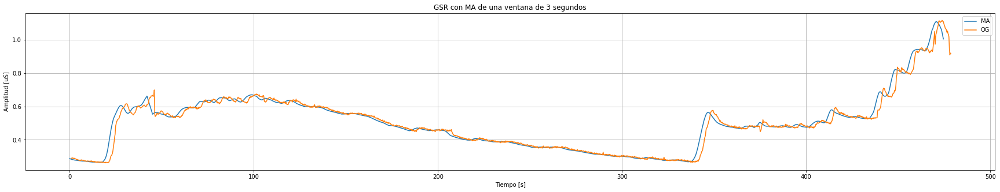

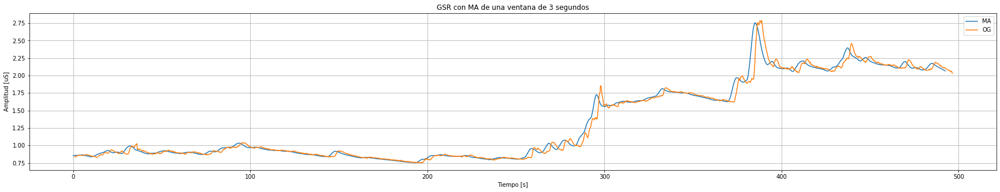

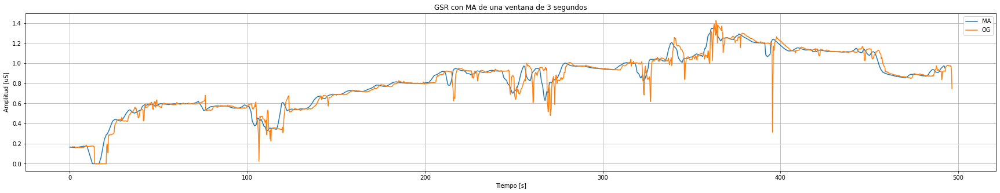

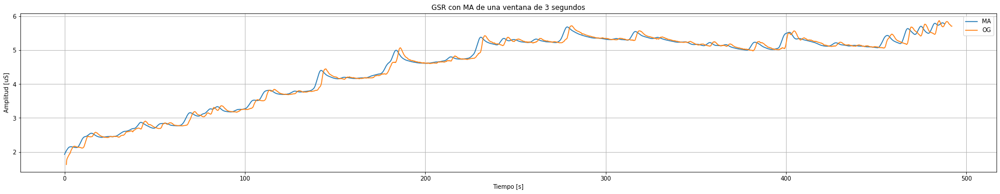

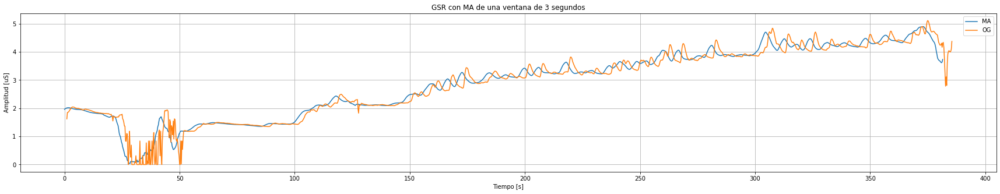

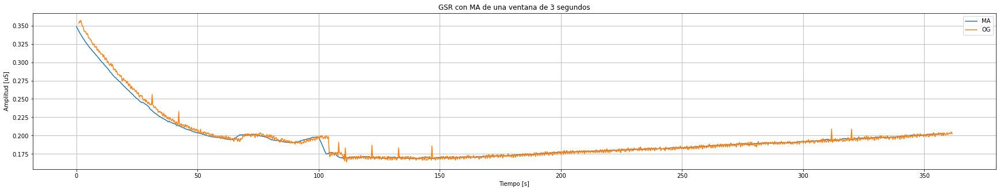

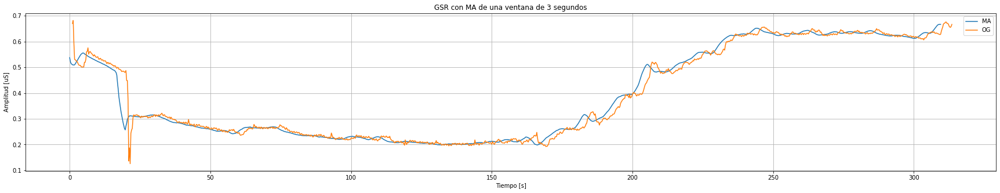

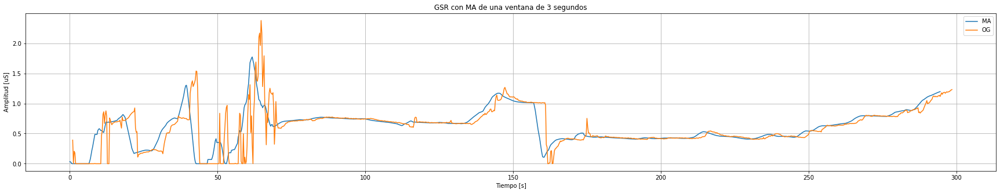

In [ ]:
#Media móvil de las 8 señales

GSR_MA,t_gsr_MA=MA1(GSR,fs_gsr, 3*fs_gsr) 
for i in range(8):
  plt.figure(figsize=(30,5))
  plt.plot(t_gsr_MA[i], GSR_MA[i], label='MA')
  plt.plot(t_gsr[i], GSR[i], label='OG')
  plt.title('GSR con MA de una ventana de 3 segundos') 
  plt.ylabel('Amplitud [uS]')
  plt.xlabel('Tiempo [s]')
  plt.legend()
  plt.grid()
  plt.show()
  print('\n')


### Normalización

A continuación se normalizará la señal de GSR según la siguiente fórmula:

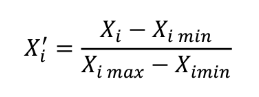

Primero, se la acondiciona con un filtro Butterworth pasa-bajos con frecuencia de corte 1 Hz.

In [ ]:
LP = butter(4, 1, btype='low', output='sos', fs = fs_gsr)
GSR_filt = []
for i in range(8):
    GSR_filt += [sosfiltfilt(LP, GSR_MA[i], axis=0)]

In [ ]:
GSR_norm=[]
for i in range(len(GSR_filt)):
  max_GSR = max(GSR_filt[i])
  min_GSR = min(GSR_filt[i])
  vect_min=np.repeat(min_GSR, len(GSR_filt[i]))
  d=(max_GSR-min_GSR)
  norm=(GSR_filt[i]-vect_min)/d
  GSR_norm+=[norm]

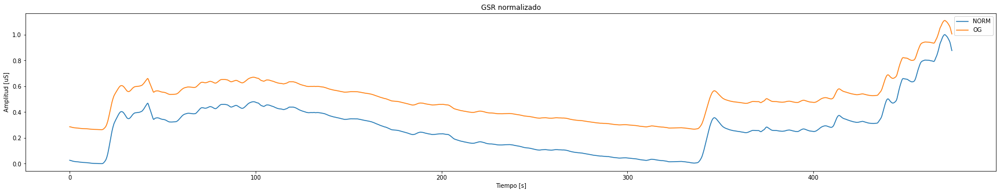

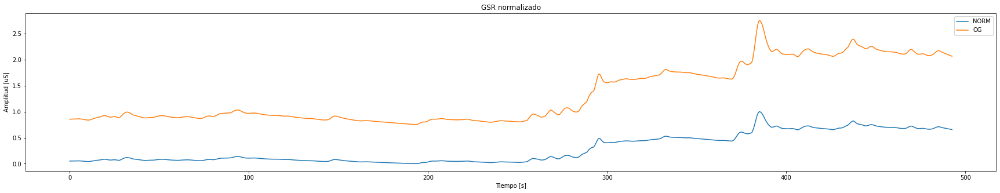

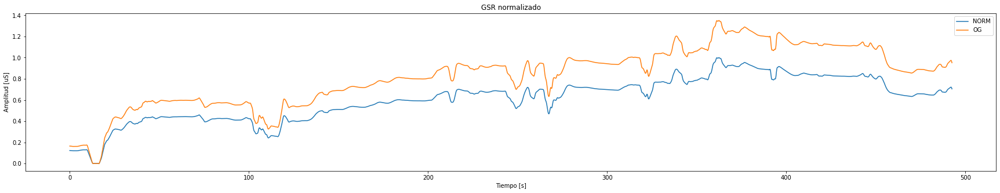

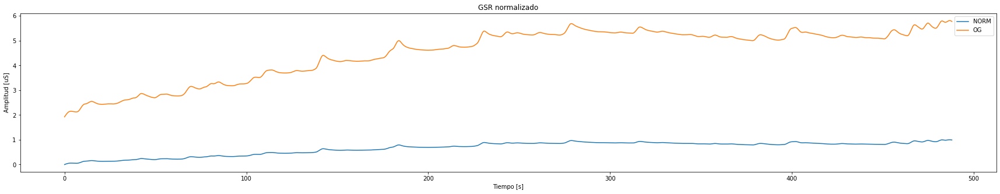

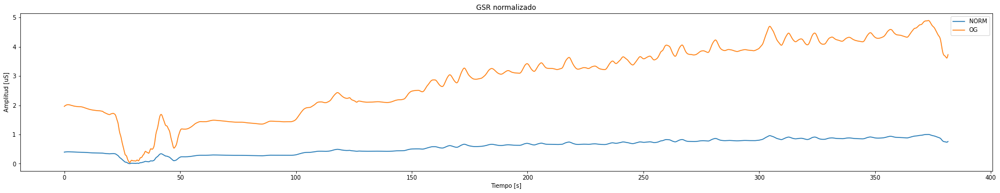

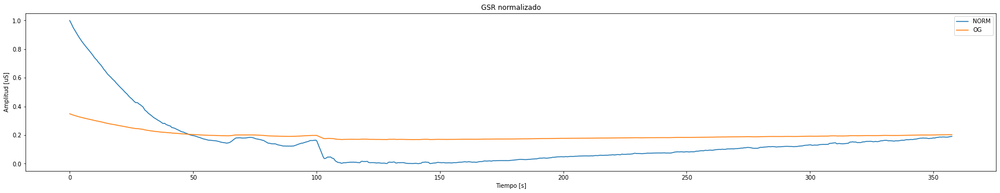

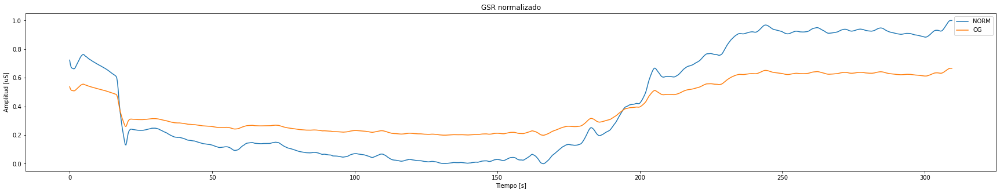

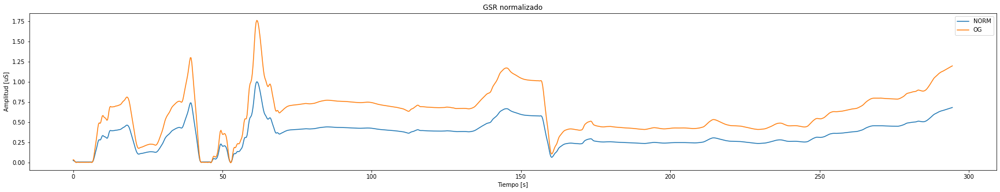

In [ ]:
for i in range(8):
  plt.figure(figsize=(30,5))
  plt.plot(t_gsr_MA[i], GSR_norm[i], label='NORM')
  plt.plot(t_gsr_MA[i], GSR_filt[i], label='OG')
  plt.title('GSR normalizado')
  plt.ylabel('Amplitud [uS]')
  plt.xlabel('Tiempo [s]')
  plt.legend()
  plt.show()
  print('\n')

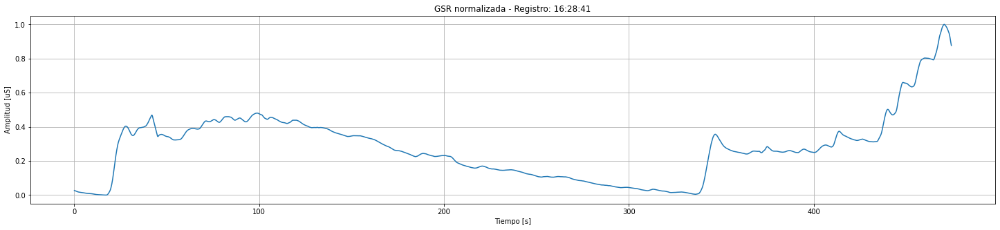

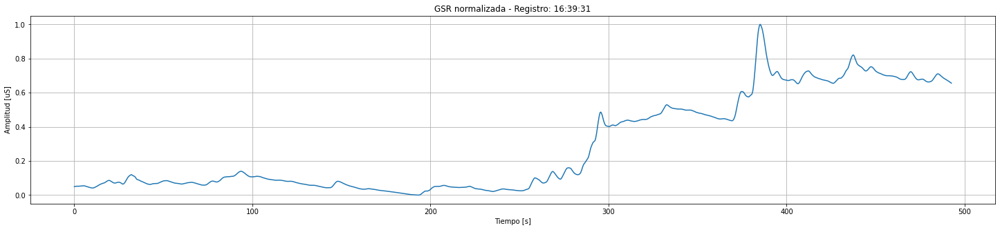

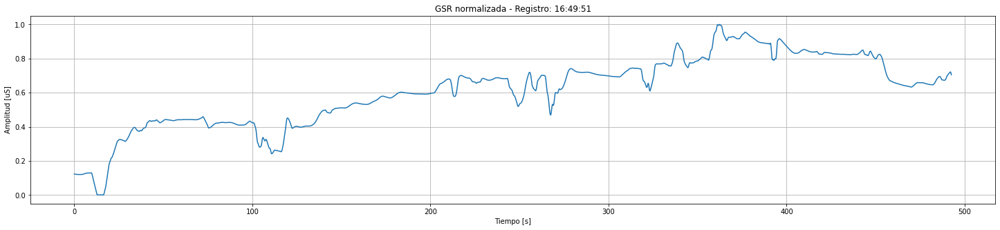

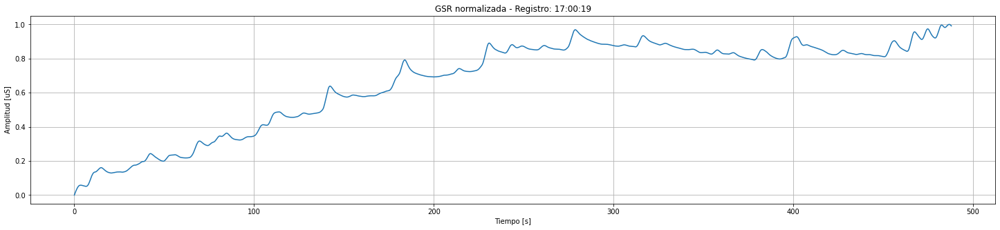

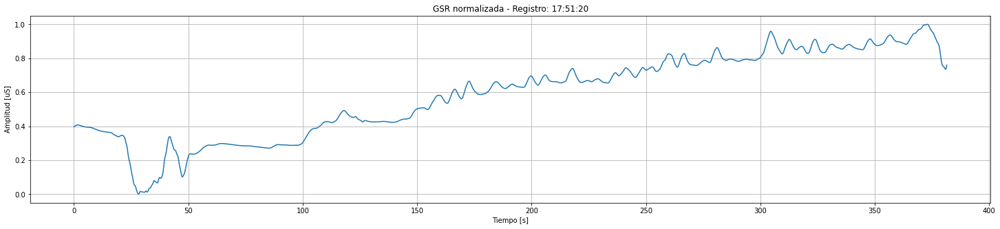

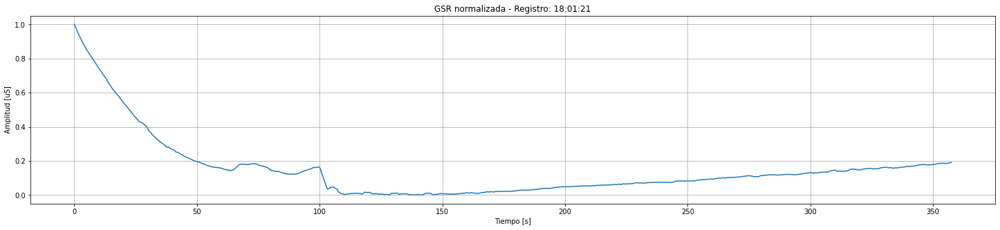

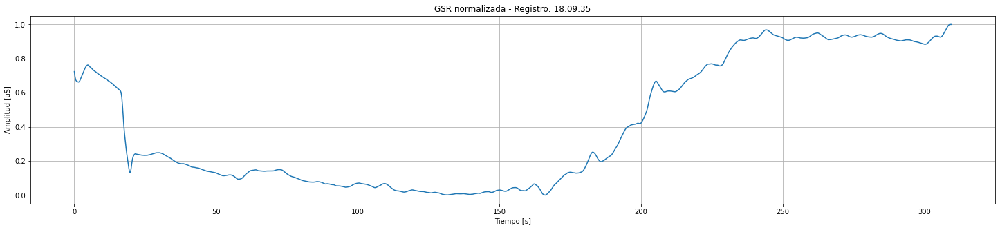

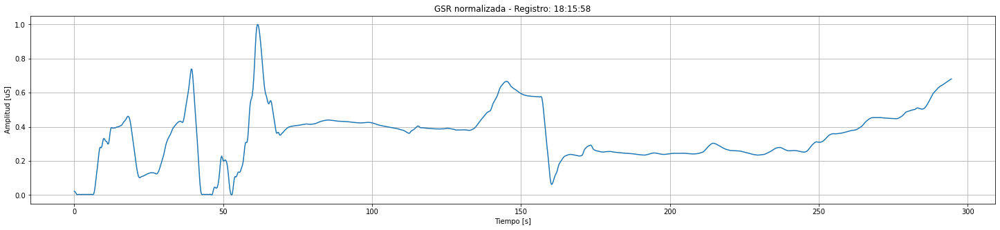

In [ ]:
plot(t_gsr_MA,GSR_norm,'GSR normalizada',horario)

### Periodograma de la derivada

En principio, se buscan los picos de la señal sin derivar, en tiempo. Para que el proceso resulte correcto se acondiciona la señal con un filtro Butterworth pasa-altos con frecuencia de corte 0.05 Hz, para separar el componente fásico del tónico (Bach et al., 2013)

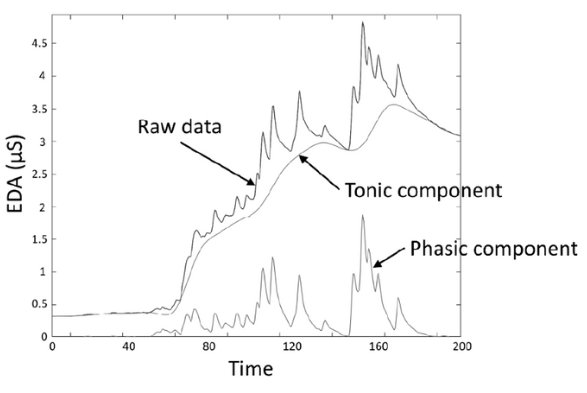

In [ ]:
HP = butter(4, 0.05, btype='highpass', output='sos', fs=fs_gsr)
GSR_filt2 = []
for i in range(8):
  GSR_filt2 += [sosfiltfilt(HP, GSR_filt[i], axis=0)]

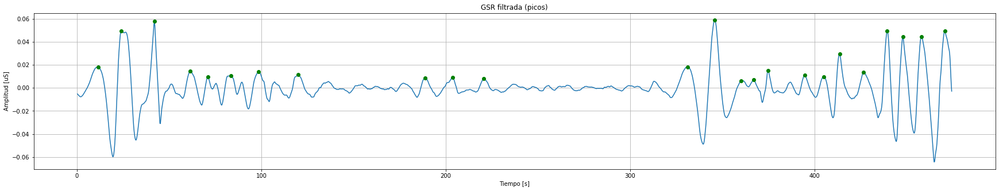

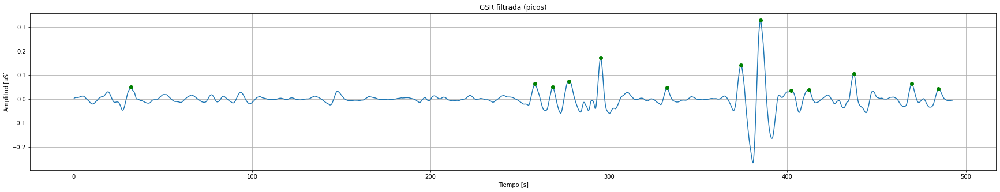

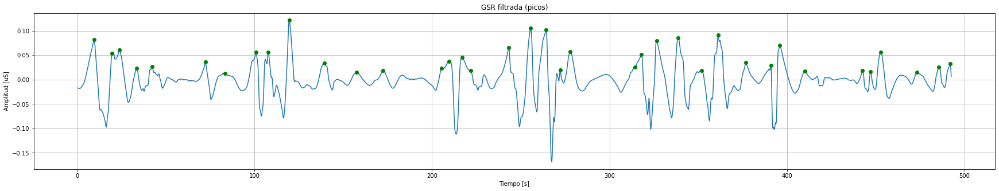

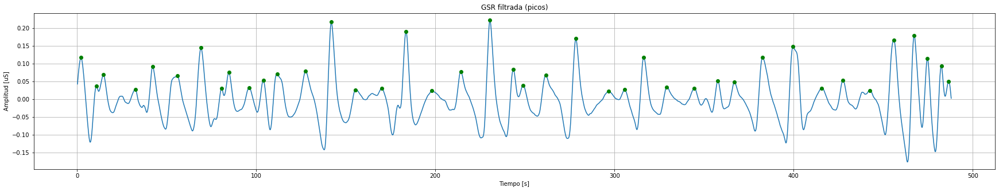

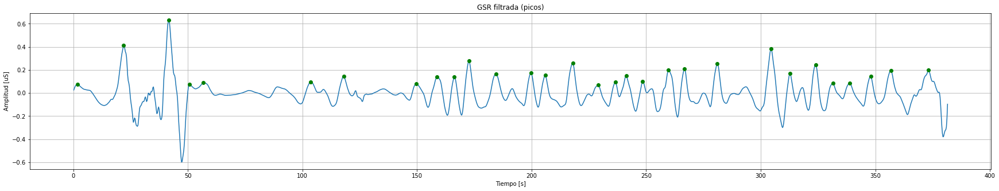

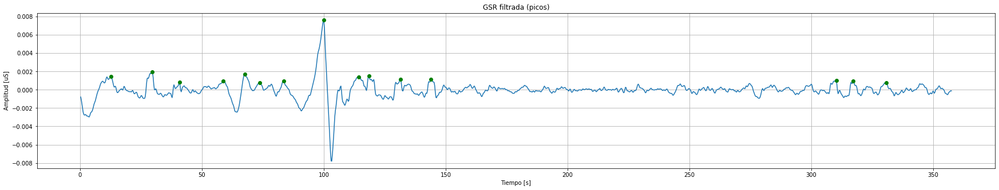

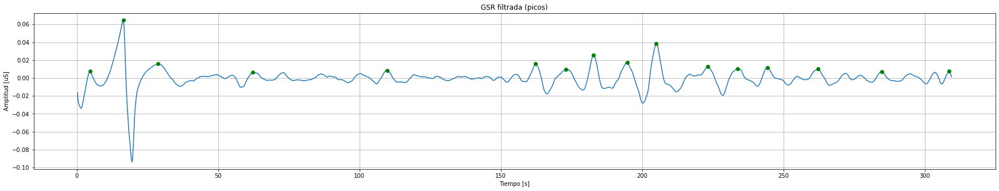

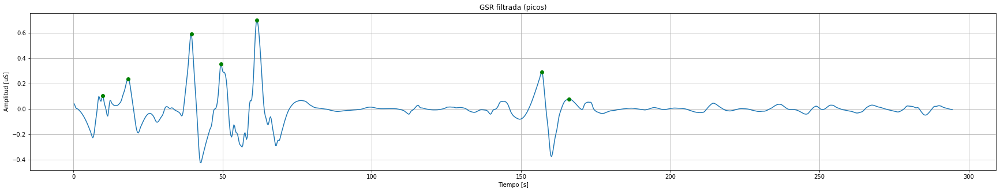



[24, 13, 38, 41, 30, 15, 16, 7]


In [ ]:
#Picos de GSR en tiempo
n_picos = []
for i in range(8):
  picos1 = find_peaks(GSR_filt2[i],distance=15, height= 0.1*max(GSR_filt2[i]))[0]
  n_picos.append(len(picos1))
  plt.figure(figsize=(30,5))
  plt.plot(t_gsr_MA[i][1:], GSR_filt2[i][1:])
  plt.plot(t_gsr_MA[i][picos1],GSR_filt2[i][picos1], 'go')
  plt.title("GSR filtrada (picos)")
  plt.ylabel("Amplitud [uS]")
  plt.xlabel("Tiempo [s]")
  plt.grid()
  plt.show()
  print("\n")

print(n_picos)

Luego, se estima la densidad espectral de potencia de la derivada de la señal a través del método de Welch y se buscan sus picos. 

In [ ]:
#Estimacion espectral con welch

def welch(signal, fs):
  nfft = nperseg = 1024
  frec, psd = sig.welch(signal, fs, nperseg=nperseg, nfft=nfft, window='hamming', noverlap=nperseg//2)
  return frec, psd

def grafico_welch(signal, titulo, hs, fs):
  n_picos = []
  for i in range(len(signal)):
    frec, psd = welch(signal[i], fs)
    picos = find_peaks(psd, height= 0.2*max(psd))[0]
    n_picos.append(len(picos))
    plt.figure(figsize=(30,5))
    plt.plot(frec,psd)
    plt.plot(frec[picos],psd[picos], 'go')
    plt.xlabel("Frecuencia")
    plt.xlim(0,1)
    plt.ylabel("PSD")
    plt.title("PSD de " + titulo + hs[i] + " (Welch)")
    plt.show()
    print("\n")
  print(n_picos)
  return 

In [ ]:
#Cálculo de la derivada
dGSR = GSR_norm.copy()
for i in range(8):
  dGSR[i] = np.diff(GSR_norm[i])

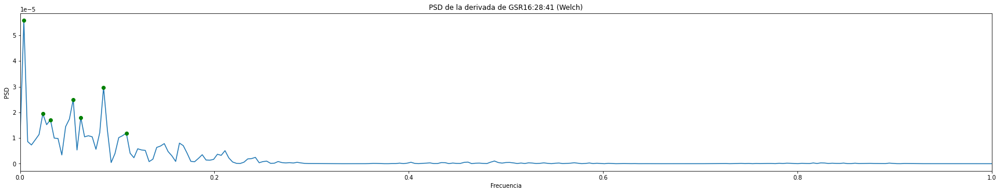

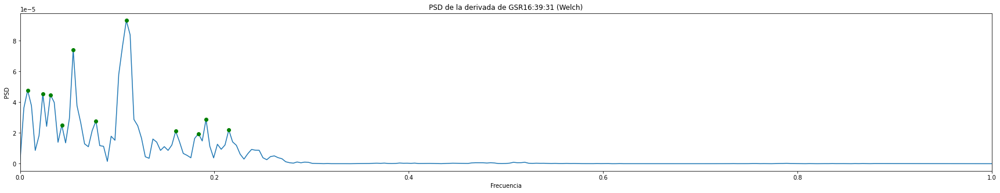

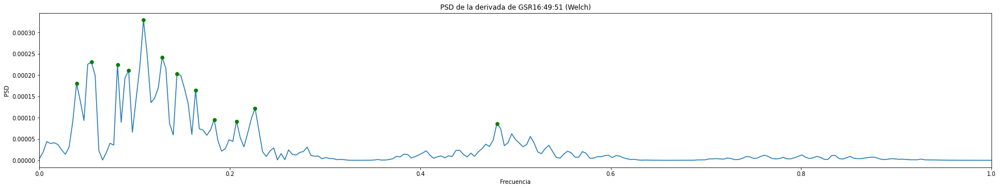

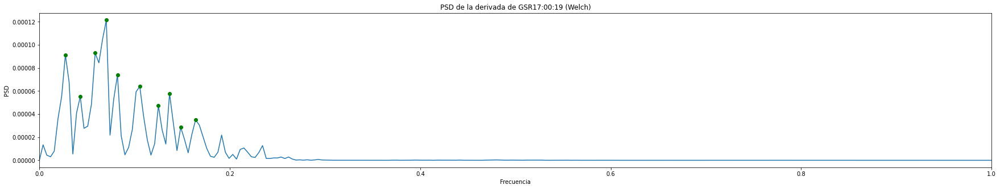

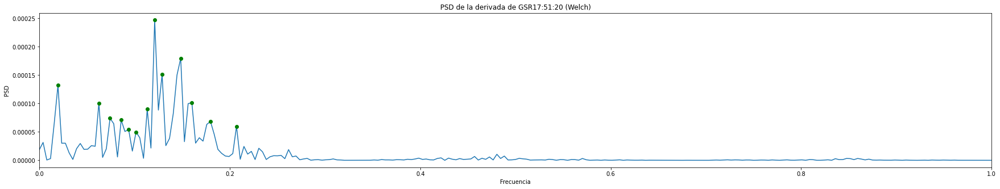

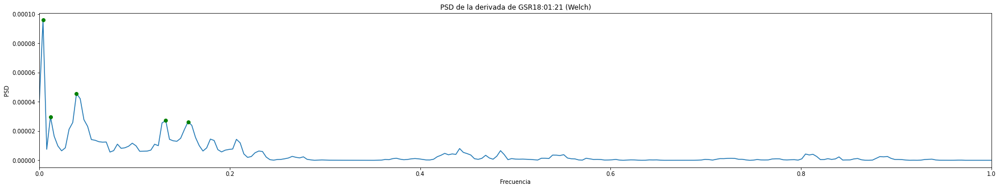

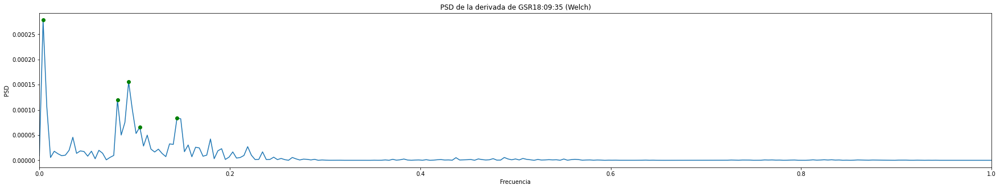

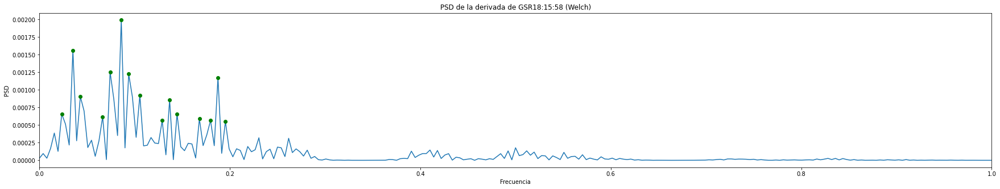



[7, 11, 12, 10, 13, 5, 5, 15]


In [ ]:
grafico_welch(dGSR, "la derivada de GSR", horario, fs_gsr)

## Señales de PPG

A continuación se analizará la señal de PPG, recordando que se muestrea a 64 Hz. En principio, se grafica la señal cruda.

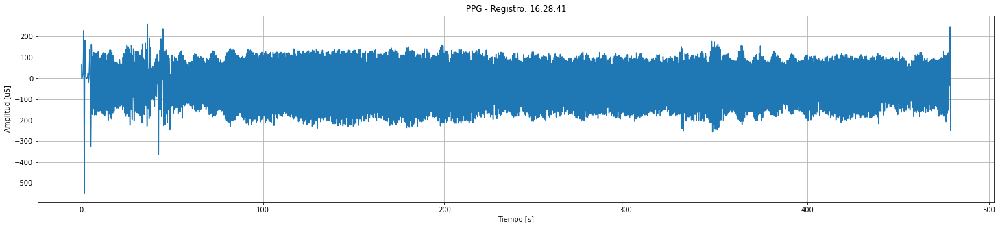

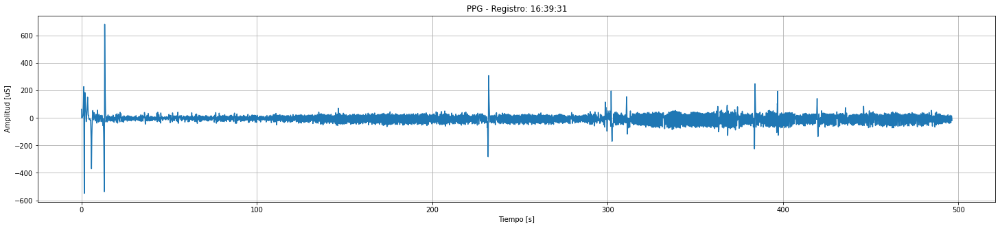

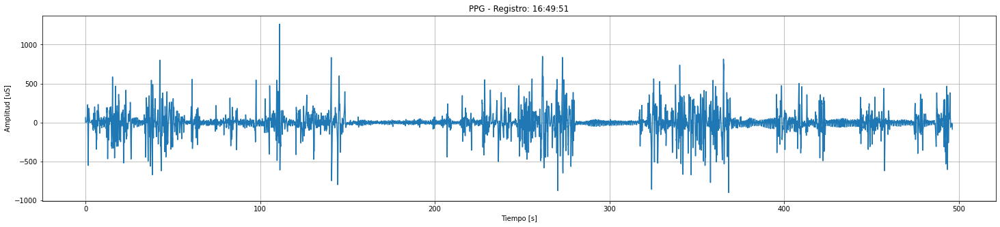

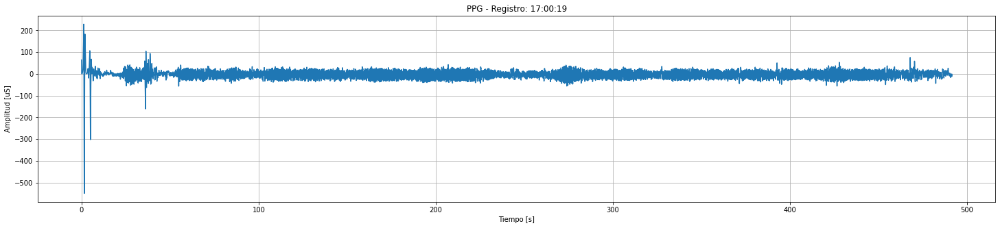

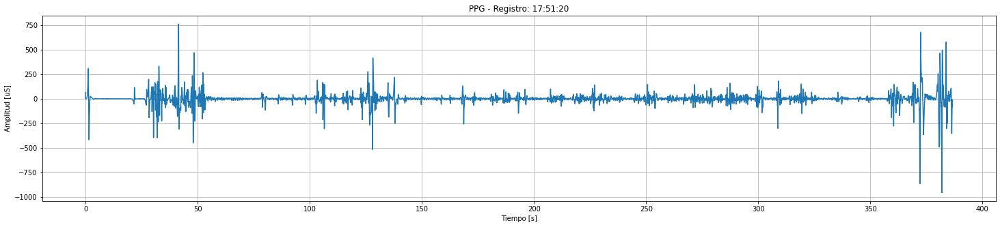

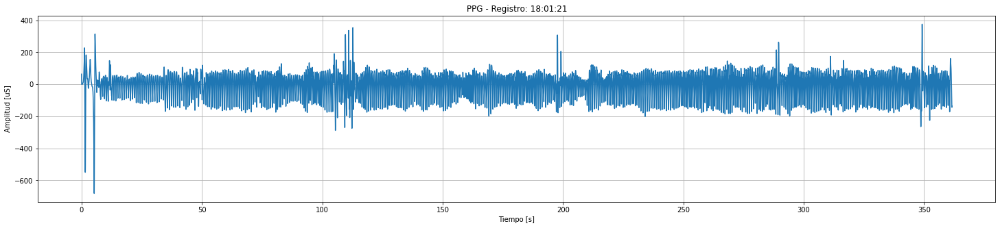

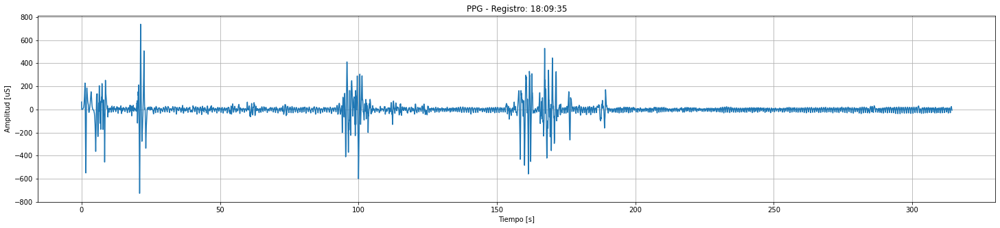

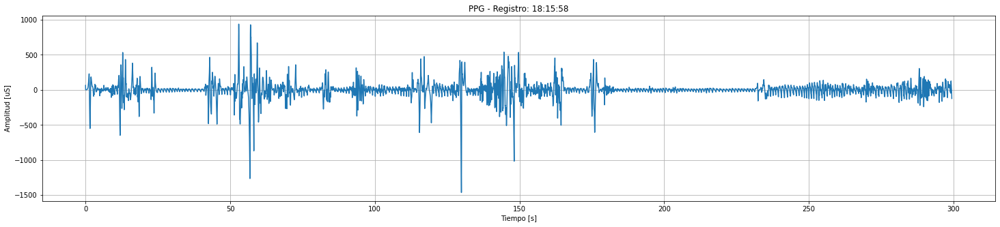

In [ ]:
fs_ppg = 64 #dato del manual
t_ppg = tiempos(fs_ppg, PPG)
plot(t_ppg,PPG,'PPG',horario)

### Acondicionamiento

Para acondicionar a la señal se prueba colocando dos filtros pasa bajos: Chebyshev tipo II y Butterworth, ambos de orden 4, siendo estos el óptimo y sub-óptimo para registros cortos de PPG (Liang et al., 2018). Además, para deshacernos del pico anómalo inicial se cortan los tres segundos iniciales.

In [ ]:
fs_ppg = 64
PPG, t_ppg = crop(PPG, t_ppg, 3*fs_ppg)

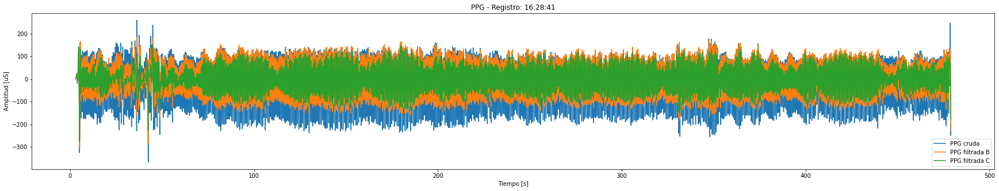

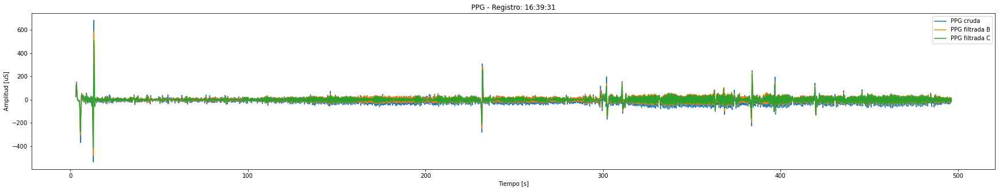

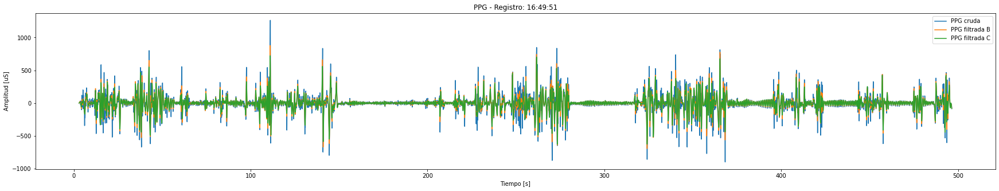

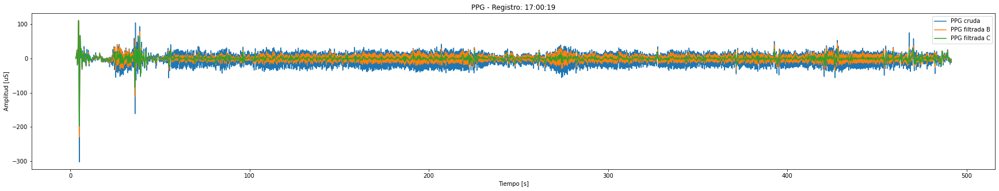

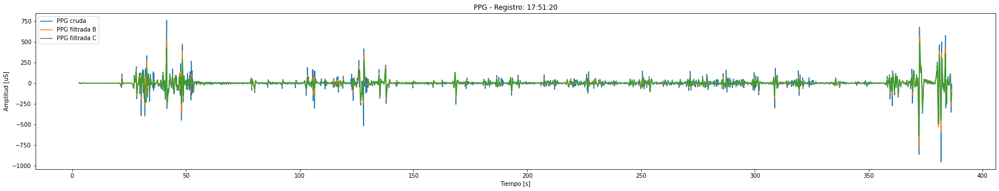

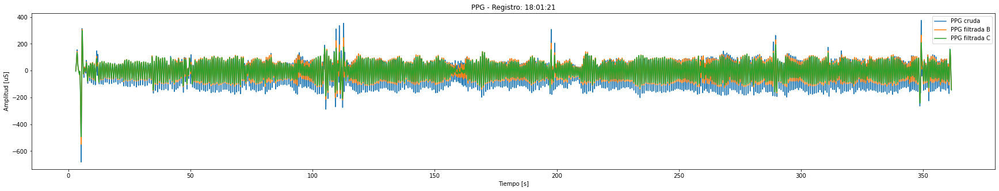

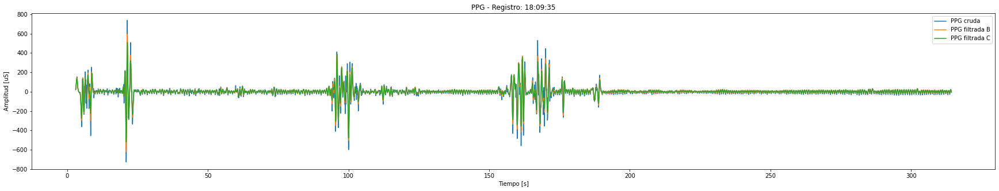

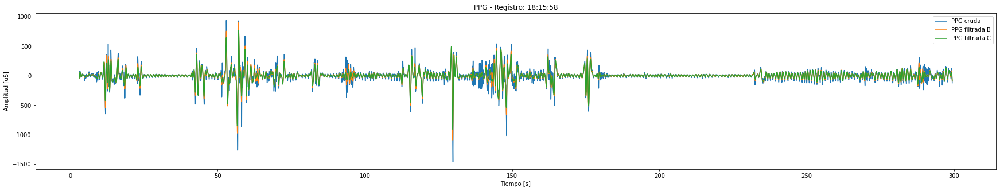

In [ ]:
#Filtrado la señal de PPG
filtro1 = butter(4, 2, btype='low', output='sos', fs=fs_ppg)
filtro2 = sig.cheby2(4, 20, 2, btype='low', output='sos', fs=fs_ppg)
PPG_filt1 = []
PPG_filt2 = []
for i in range(8):
  PPG_filt1 += [sosfiltfilt(filtro1, PPG[i], axis=0)]
  PPG_filt2 += [sosfiltfilt(filtro2, PPG[i], axis=0)]
  plt.figure(figsize=(30,5))
  plt.plot(t_ppg[i], PPG[i], label='PPG cruda')
  plt.plot(t_ppg[i], PPG_filt1[i], label='PPG filtrada B')
  plt.plot(t_ppg[i], PPG_filt2[i], label='PPG filtrada C')
  plt.title('PPG - Registro: '+ horario[i])
  plt.ylabel('Amplitud [uS]')
  plt.xlabel('Tiempo [s]')
  plt.legend()
  plt.show()
  print('\n')

Se decidió considerar, de ahora en adelante, la señal filtrada con el Butterworth, ya que la otra parecería estar demasiado atenuada.

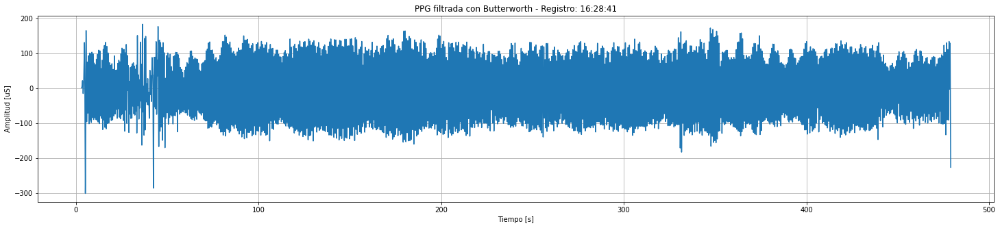

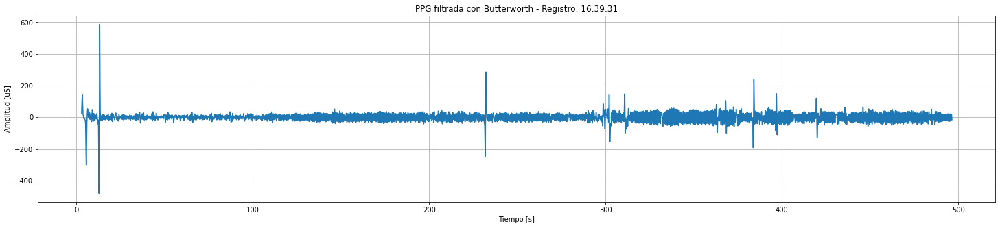

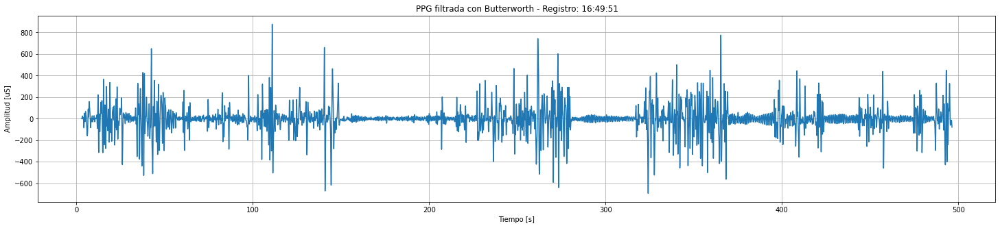

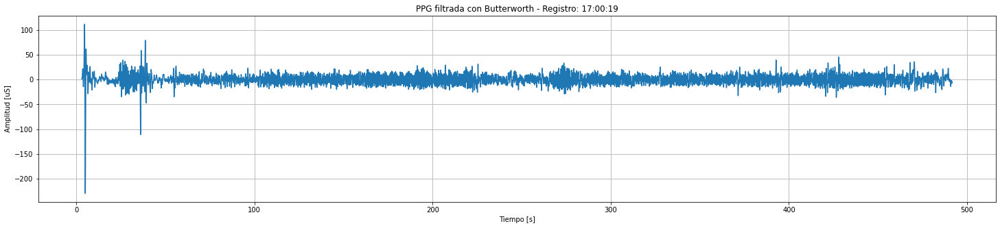

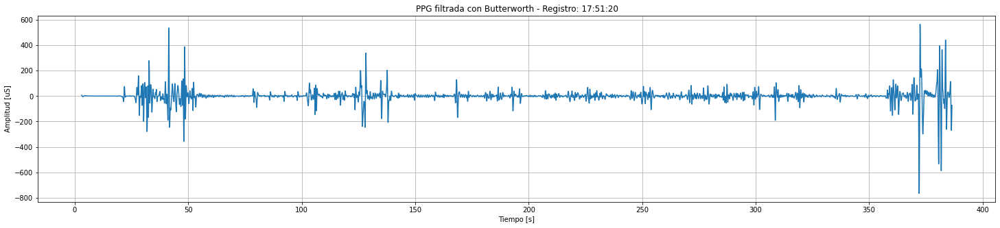

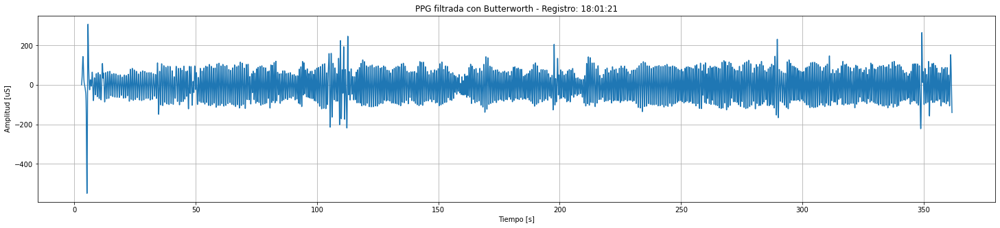

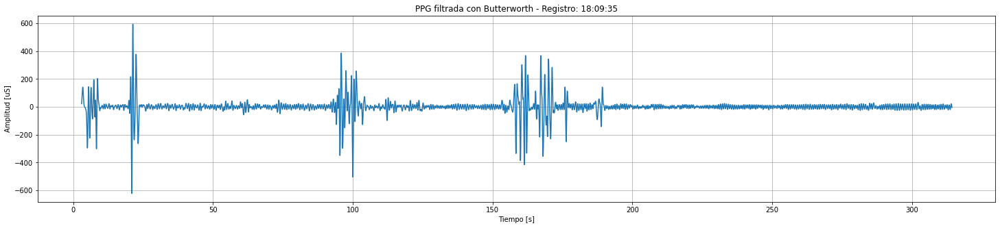

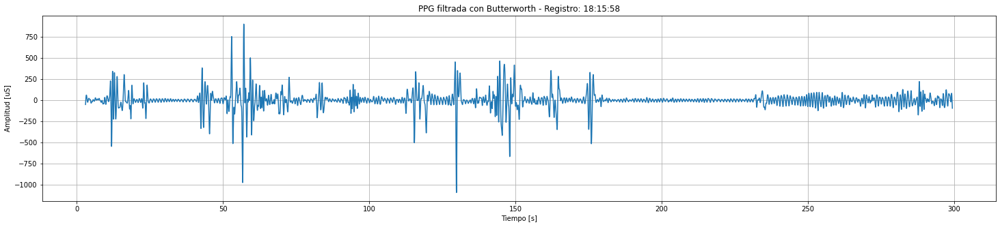

In [ ]:
plot(t_ppg, PPG_filt1, 'PPG filtrada con Butterworth', horario)

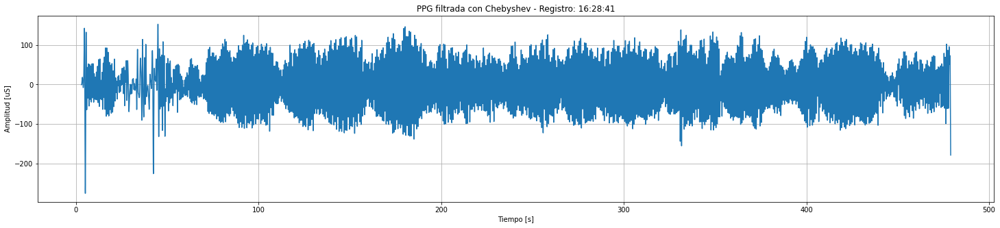

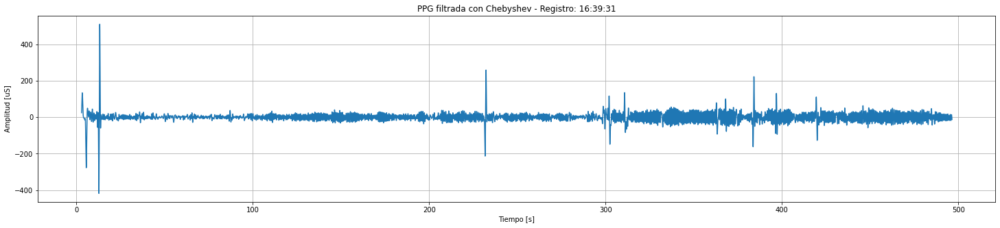

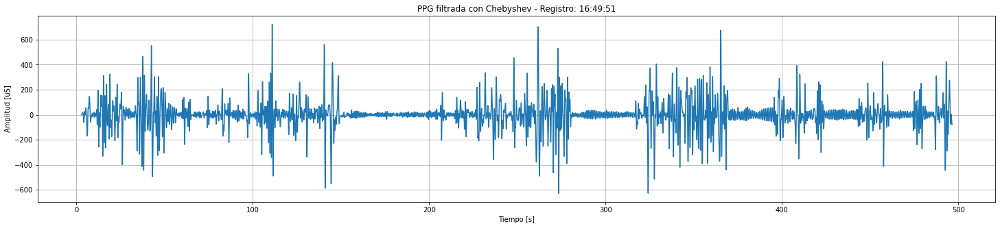

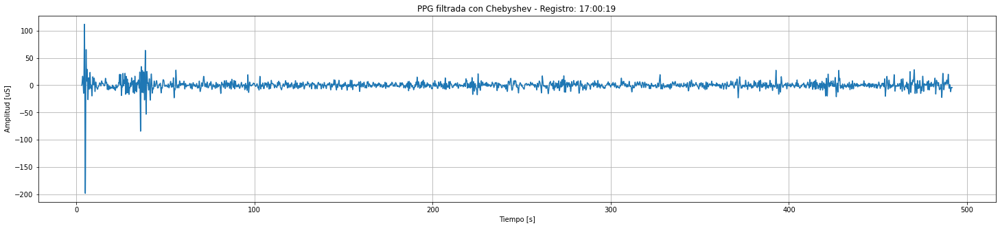

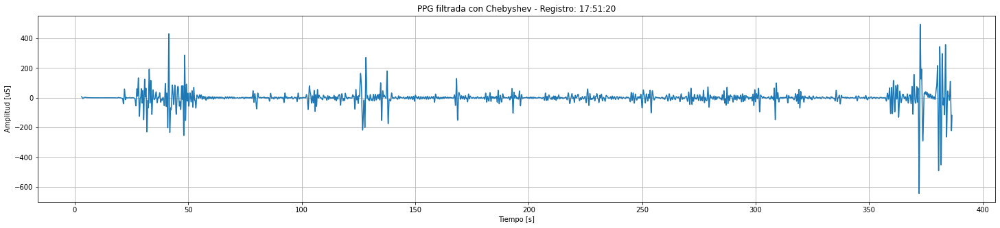

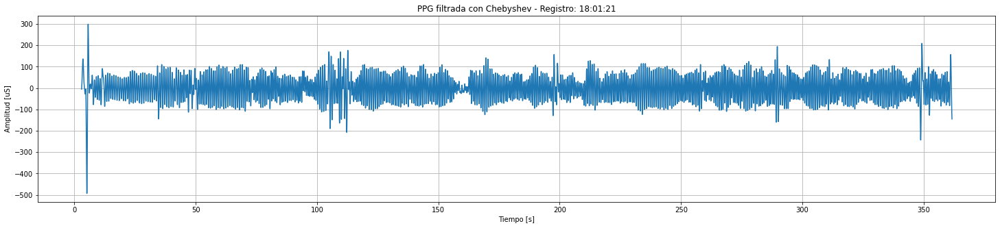

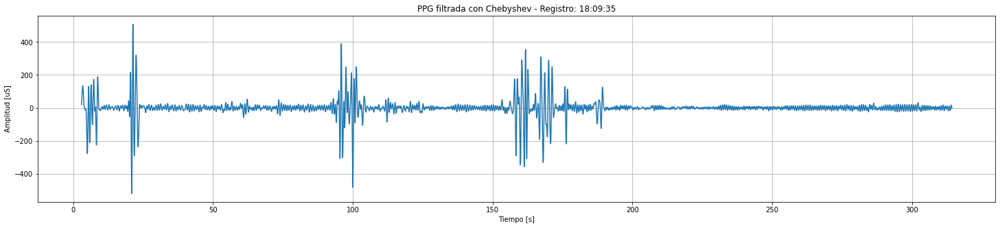

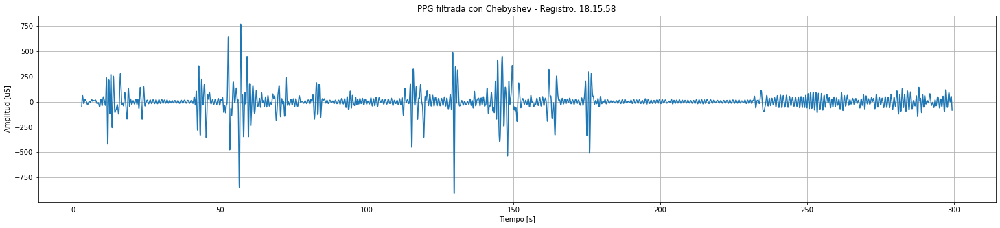

In [ ]:
plot(t_ppg, PPG_filt2, 'PPG filtrada con Chebyshev', horario)

Posteriormente se buscan los picos de la señal, y se los grafica en una ventana de un minuto. Se calcula, además, la frecuencia cardíaca a partir de la señal de PPG cruda y filtrada.

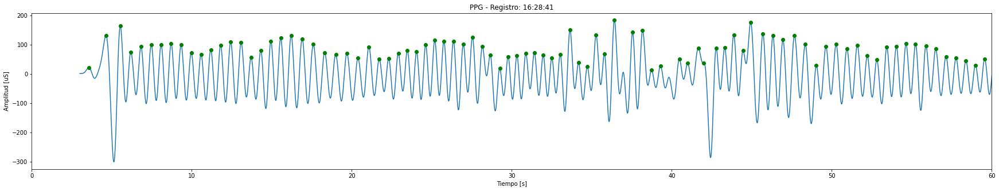

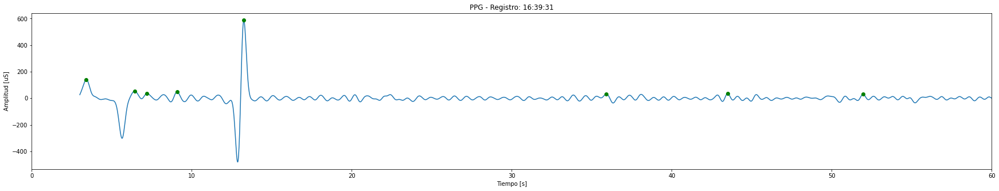

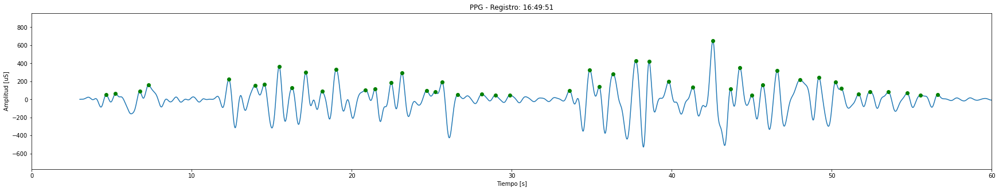

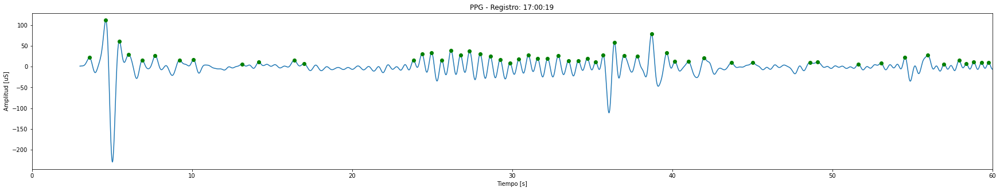

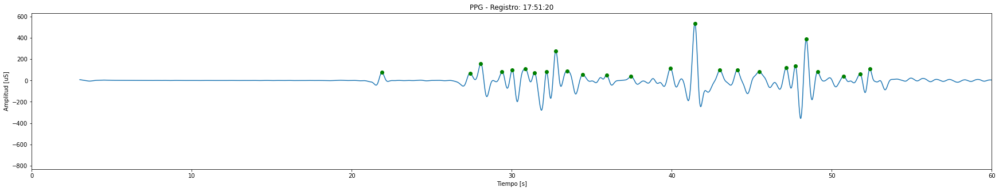

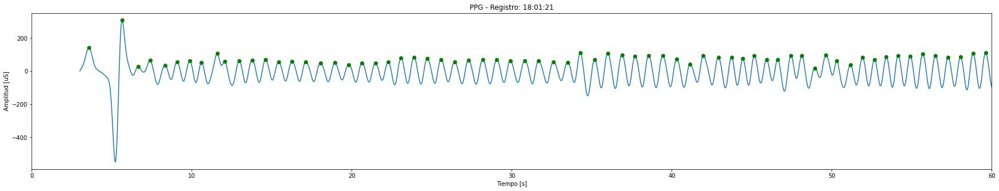

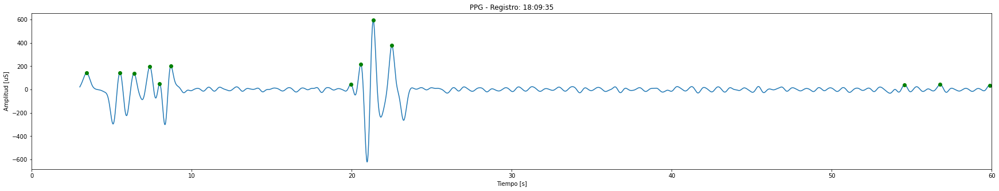

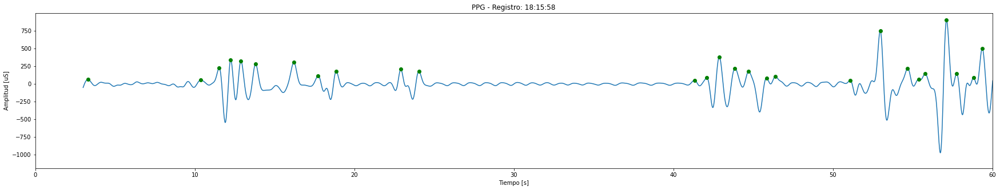



PPG filtrda:  [88.6, 30.1, 32.0, 91.9, 18.8, 79.3, 11.3, 26.9]
PPG cruda:  [110.7, 30.5, 53.4, 116.0, 38.6, 120.0, 20.0, 59.5]


In [ ]:
ps = []
ps2 = []
FC1 = []
FC2 = []
for i in range(8):
  x_ppg = np.ravel(PPG_filt1[i])
  x_ppg_1 = np.ravel(PPG[i])
  picos_ppg1 = find_peaks(x_ppg_1,distance=10, height=0.05*max(x_ppg))[0]
  picos_ppg2 = find_peaks(x_ppg,distance=10, height=0.05*max(x_ppg))[0]
  ps +=[picos_ppg2]
  ps2 += [picos_ppg1]
  FC1 += [round(len(ps[i])*60/t_ppg[i][-1],1)]
  FC2 += [round(len(ps2[i])*60/t_ppg[i][-1],1)]
  plt.figure(figsize=(30,5))
  plt.plot(t_ppg[i],x_ppg)
  plt.plot(t_ppg[i][picos_ppg2],x_ppg[picos_ppg2], 'go')
  plt.title('PPG - Registro: '+horario[i])
  plt.ylabel('Amplitud [uS]')
  plt.xlabel('Tiempo [s]')
  plt.xlim([0,60])
  plt.show()
  print('\n')
print("PPG filtrda: ", FC1)
print("PPG cruda: ", FC2)

### Cálculo de HRV

Luego, se calcula la variabilidad de la frecuencia cardíaca (o HRV, por sus siglas en inglés) en base a la señal de PPG. El cálculo se realiza mediante la *toolbox* de Pyhton pyhrv, que según los picos calculados antes y el vector tiempo devuelve los intervalos NN. 

In [ ]:
!pip install pyhrv
import pyhrv
import pyhrv.tools as tools

In [ ]:
rpeaks = []
for i in range(len(ps)):
  rpeaks+=[t_ppg[i][ps[i]]]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


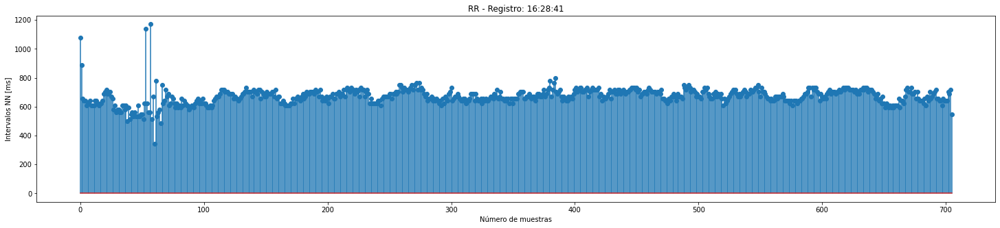

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


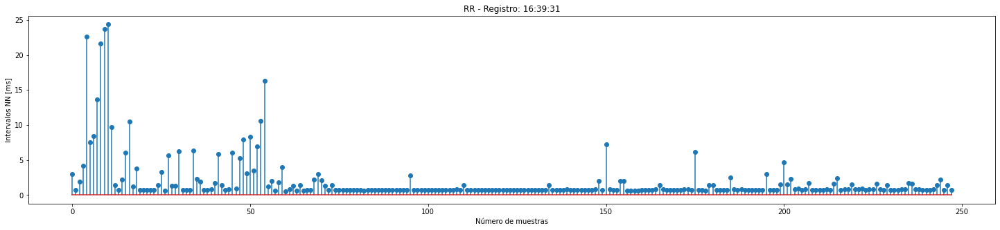

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


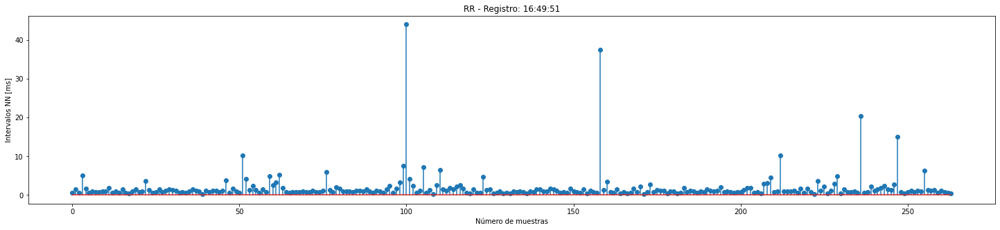

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


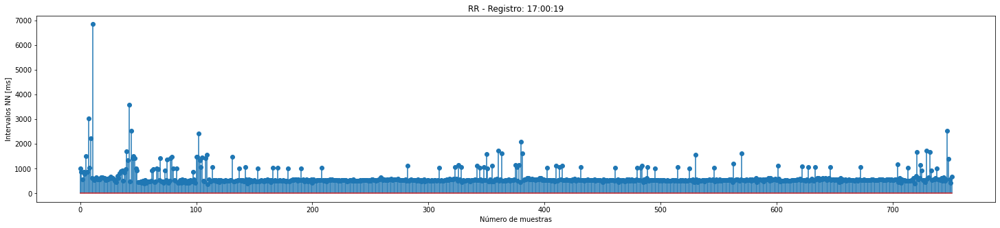

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


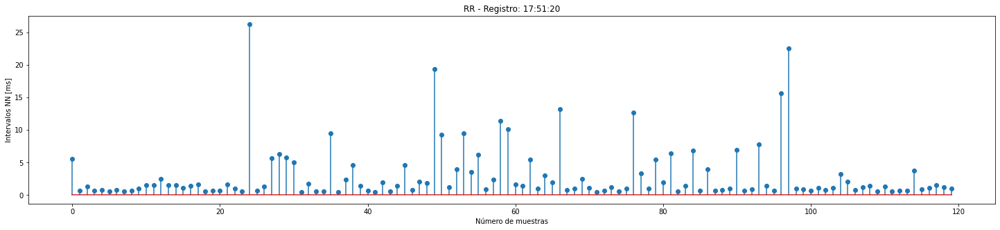

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


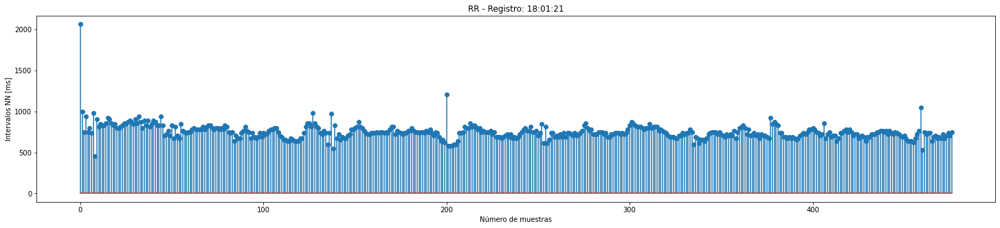

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


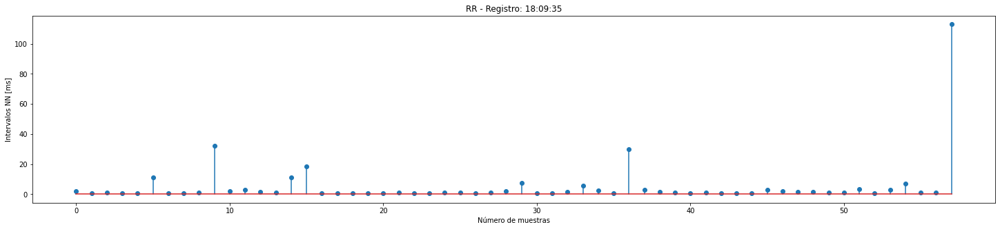

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys


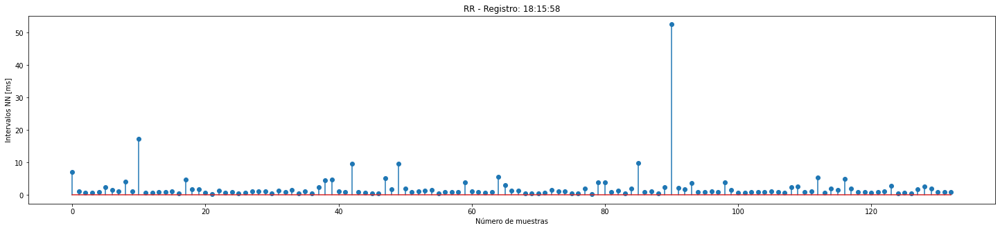

In [ ]:
#calculo de HRV  ##### Estos graficos no tienen ejes
nni_1 = []
for i in range(8):
  nni = tools.nn_intervals(rpeaks[i])
  nni_1 += [nni]
  plt.figure(figsize=(25,5))
  plt.stem(nni)
  plt.xlabel("Número de muestras")
  plt.ylabel("Intervalos NN [ms]")
  plt.title('RR - Registro: ' + horario[i])
  plt.show()
  print("\n")

### Análisis espectral

Luego se realiza un análisis espectral de la señal de HRV a través del periodograma de Lomb. Este método permite estimar la densidad espectral de potencia de una serie temporal no equiespaciada en el tiempo, como es el caso de la variabilidad de la frecuencia cardíaca.

In [ ]:
import pyhrv.frequency_domain as fd

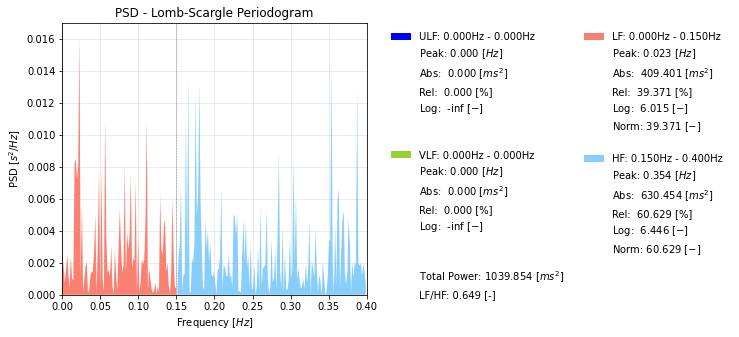

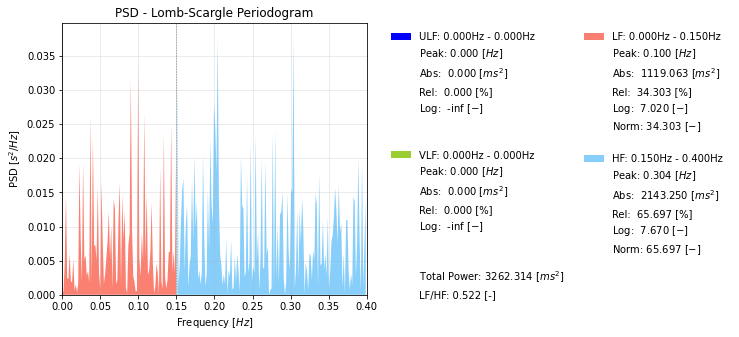

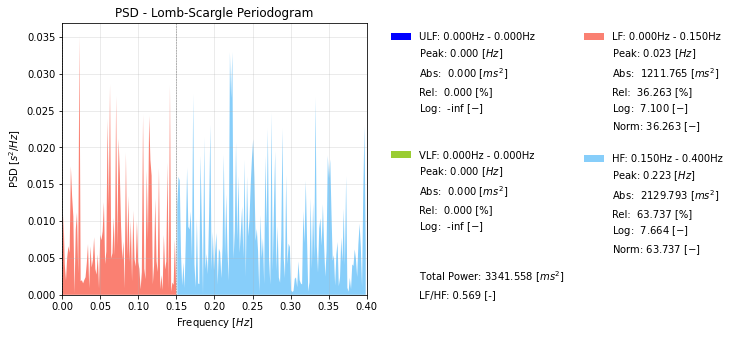

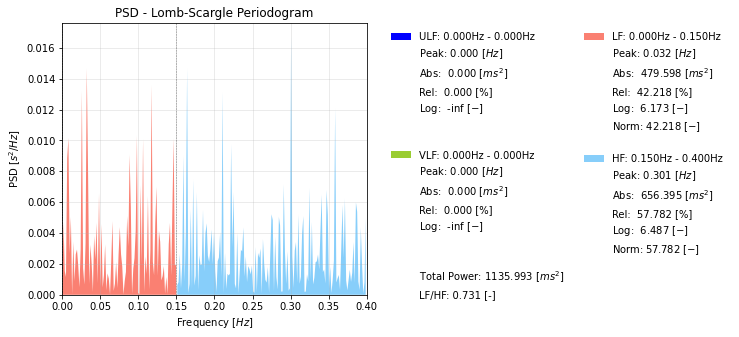

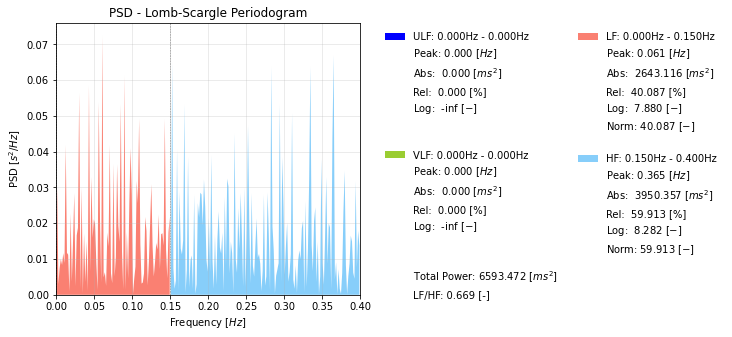

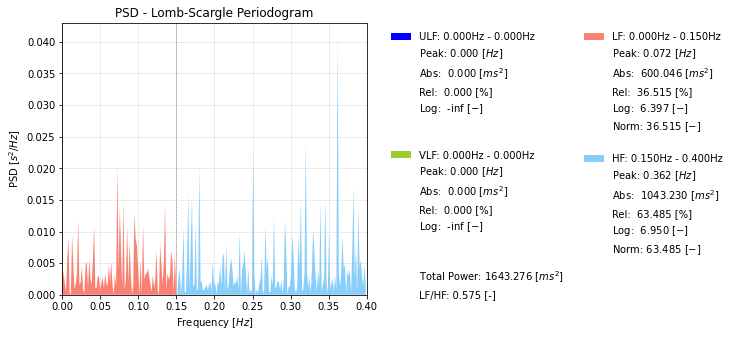

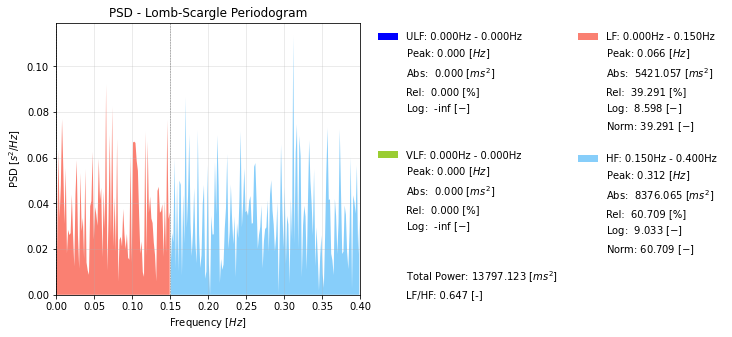

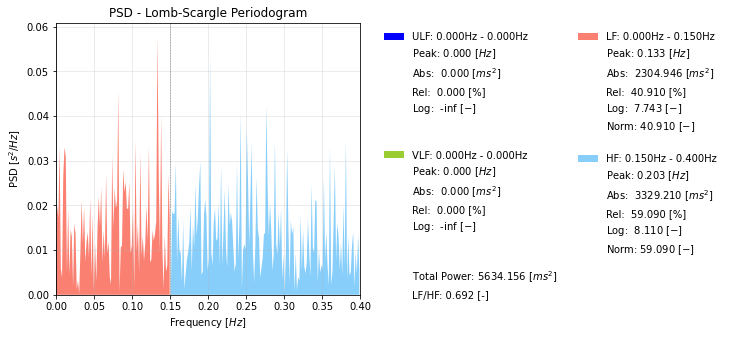

In [ ]:
#Periodograma de Lomb
fbands = {'ulf':(0.0, 0.0),'vlf':(0.0, 0.0), 'lf': (0.0, 0.15), 'hf': (0.15, 0.4)}
maximos = []
for i in range(len(rpeaks)):
  resultado = fd.lomb_psd(rpeaks=rpeaks[i], fbands=fbands)
  maximos += [resultado['lomb_peak']]
  print("\n")

La función `psd_lomb` de pyhrv calcula los picos en cada banda de frecuencia (ultra-baja, muy baja, baja y alta). En este caso solo se generaron dos bandas: baja, de 0 a 0.15 Hz, y alta, de 0.15 a 0.4 Hz. Observando la altura de los picos en las frecuencias "pico", la frecuencia dominante resulta para cada registro:


1. 0.105 Hz
2. 0.373 Hz
3. 0.267 Hz
4. 0.023 Hz
5. 0.246 Hz
6. 0.093 Hz
7. 0.105 Hz
8. 0.386 Hz

Como se observa, se hallan repartidas equitativamente: 50% en la banda de alta frecuencia y 50% en la de baja. Además, en promedio, la frecuncia dominante es de 0.19975 Hz.





In [ ]:
print(maximos)

[(0.0, 0.0, 0.02250980392156863, 0.3537254901960784), (0.0, 0.0, 0.09968627450980393, 0.3038823529411765), (0.0, 0.0, 0.02250980392156863, 0.22349019607843137), (0.0, 0.0, 0.03215686274509804, 0.3006666666666667), (0.0, 0.0, 0.061098039215686274, 0.36498039215686273), (0.0, 0.0, 0.07235294117647059, 0.36176470588235293), (0.0, 0.0, 0.06592156862745098, 0.31192156862745096), (0.0, 0.0, 0.13345098039215686, 0.20258823529411765)]


In [ ]:
print(resultado)

ReturnTuple(lomb_bands=ReturnTuple(ulf=[0.0, 0.0], vlf=[0.0, 0.0], lf=[0.0, 0.15], hf=[0.15, 0.4]), lomb_peak=(0.0, 0.0, 0.13345098039215686, 0.20258823529411765), lomb_abs=(0.0, 0.0, 2304.9460503535793, 3329.209807245234), lomb_rel=(0.0, 0.0, 40.910228765590276, 59.089771234409724), lomb_log=(-inf, -inf, 7.74281254967032, 8.110490259693997), lomb_norm=(40.91022876559028, 59.08977123440973), lomb_ratio=0.6923402800680846, lomb_total=5634.155857598813, lomb_plot=<Figure size 864x360 with 2 Axes>, lomb_nfft=256, lomb_ma=None)


### Comparación con IBI

Luego se compara el cálculo de HRV con el archivo IBI generado en cada registro, que tiene en su primer columna el segundo en el cual se detecta un latido y en la segunda el intervalo entre dos latidos consecutivos, a través del periodograma de Lomb. Cabe destacar que en el quinto registro el archivo IBI se encuentra vacío.

Generando gráficos *stem*, se observa visualmente que el cálculo de HRV a partir de la señal de PPG y del IBI resultan muy distintos. 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


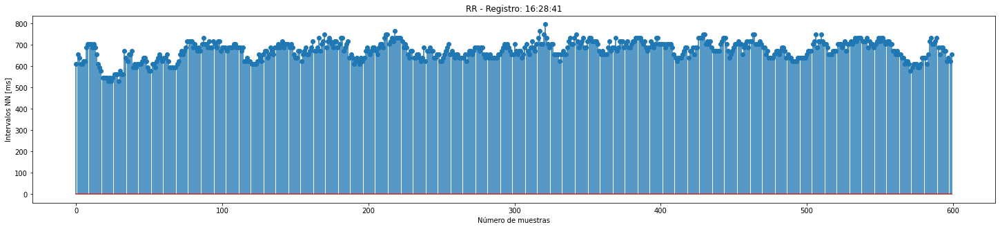

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


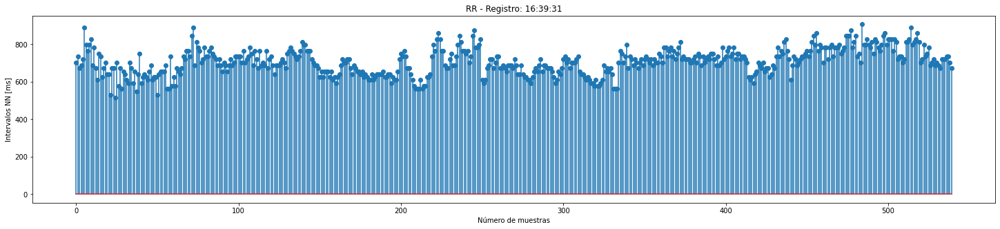

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


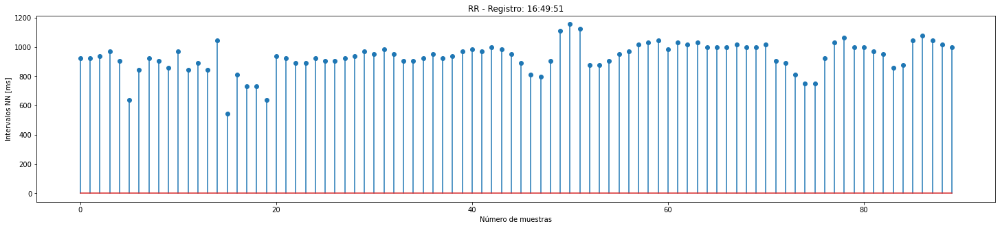

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


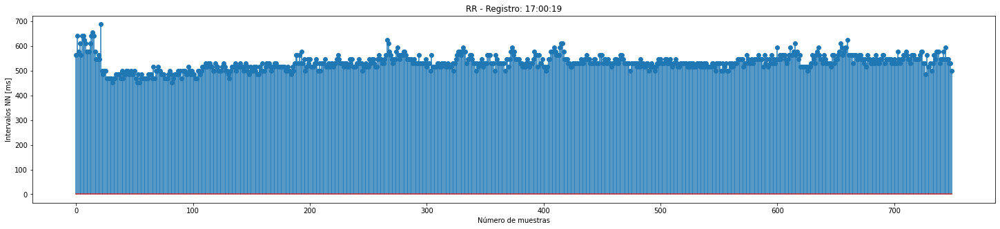

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


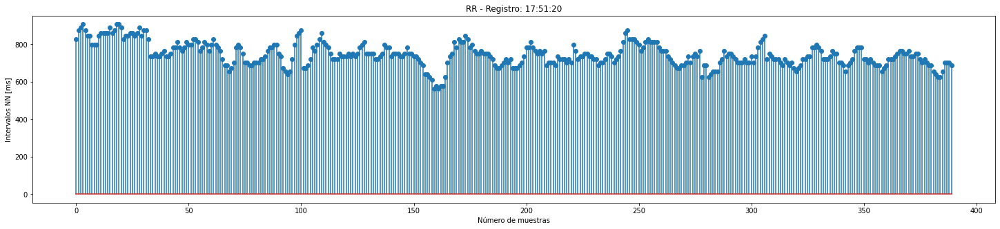

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


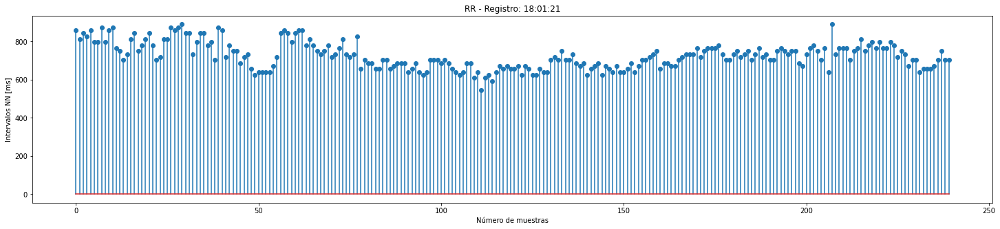

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.


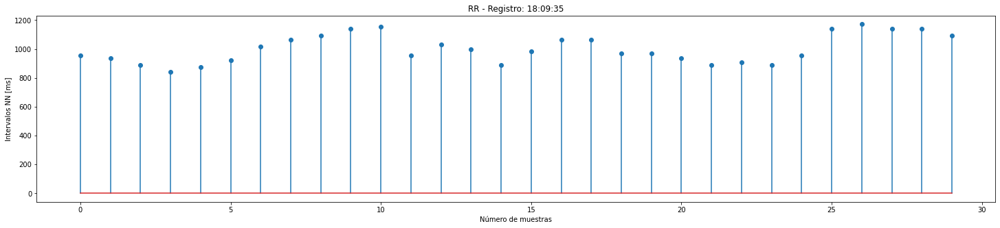

<Figure size 1800x360 with 0 Axes>

In [ ]:
for i in range(8):
  try:
    plt.figure(figsize=(25,5))
    plt.stem(IBI[i].values[:,1]*1000)
    plt.xlabel("Número de muestras")
    plt.ylabel("Intervalos NN [ms]")
    plt.title('RR - Registro: ' + horario[i])
    plt.show()
    print("\n")
  except:
    continue

Luego, se graficaron los periodogramas de Lomb y se calculó la frecuencia cardíaca.

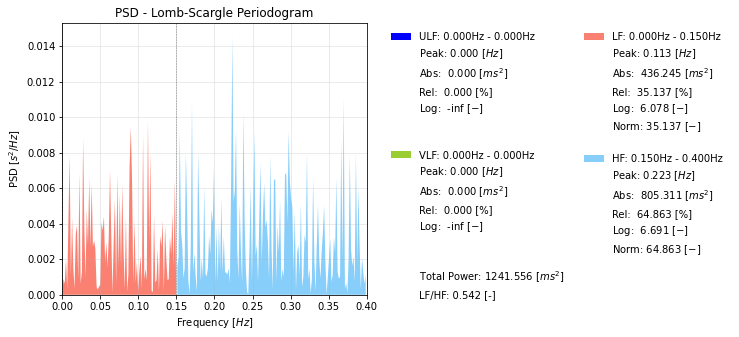

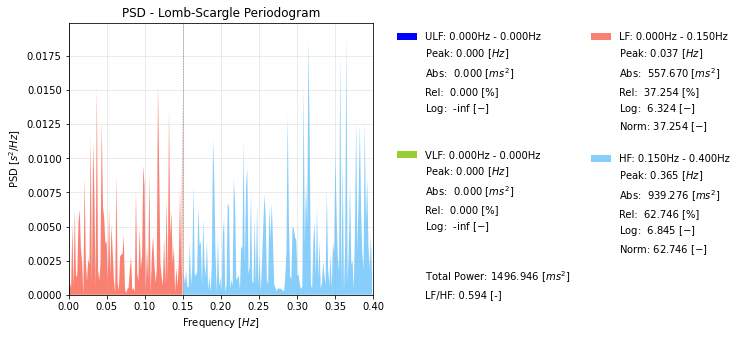

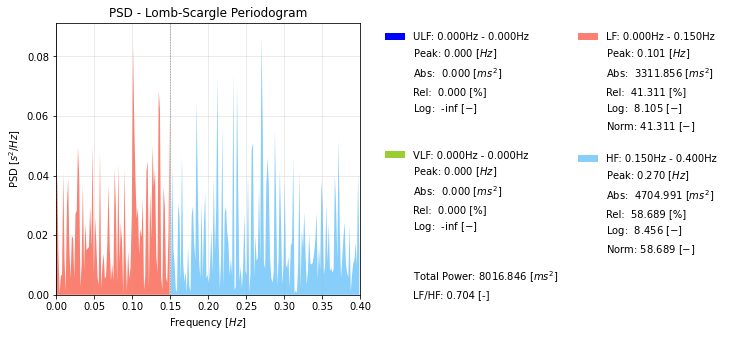

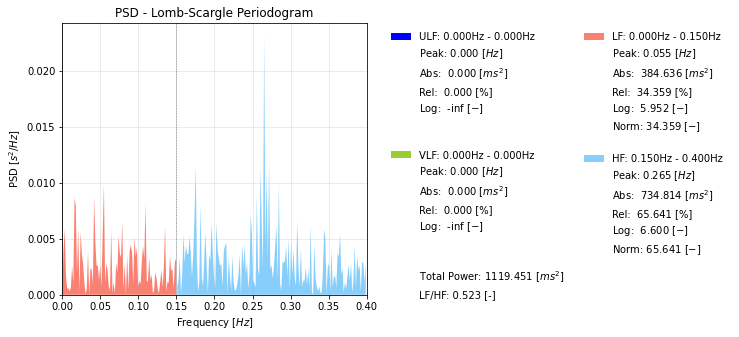

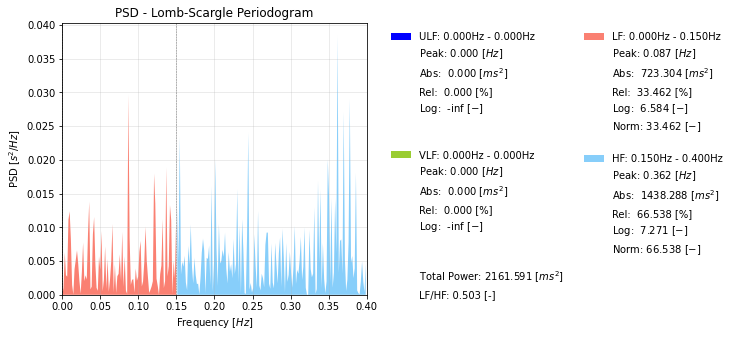

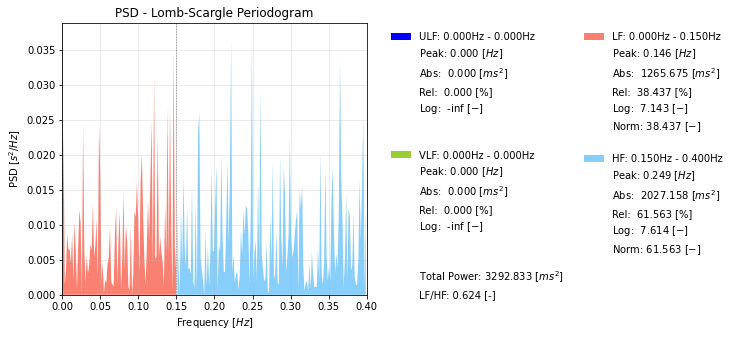

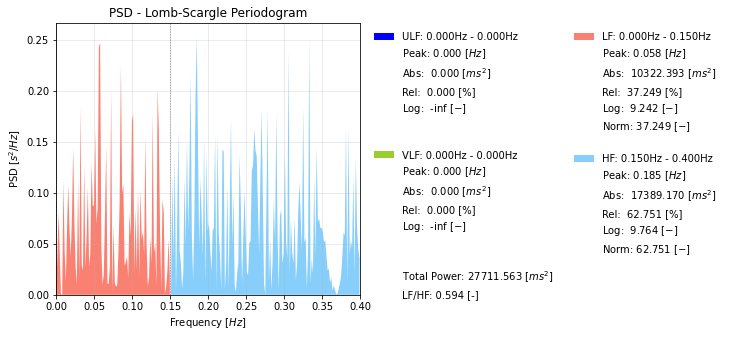



[88.99188876013905, 84.94531153987957, 64.34555948612922, 112.6628330008215, 80.49881745861104, 82.61025457153102, 59.84415584415584]


In [ ]:
#Comparacion con IBI.csv
fbands = {'ulf':(0.0, 0.0),'vlf':(0.0, 0.0), 'lf': (0.0, 0.15), 'hf': (0.15, 0.4)}
r_peaks =[]
FC_ibi = []
for j in range(8):
  try:
    r_peaks += [IBI[j].values[:,0]]
    FC_ibi += [60/np.mean(IBI[j].values[:,1])]
    fd.lomb_psd(rpeaks=r_peaks[j], fbands=fbands)
    print("\n")
  except:
    continue

print(FC_ibi)

Ahora, según el IBI, la frecuencia dominante resulta para cada registro:


1. 0.223 Hz
2. 0.365 Hz
3. 0.270 Hz
4. 0.265 Hz
5. IBI vacío
6. 0.362 Hz
7. 0.249 Hz
8. 0.185 Hz

Se observa que esta vez todas se hallan dentro de la banda de alta frecuencia. Además, recordando que los primeros cuatro registros son de la etapa de ansiedad y los otros cuatro de la basal, se ve un aumento de la frecuencia cardíaca en la primera etapa.

In [ ]:
D1 = []
D2 = []
for i in range(8):
  if i < 4:
    D1 += [str(round((abs(FC1[i] - FC_ibi[i]))*100/FC_ibi[i],1)) + ' %']
    D2 += [str(round((abs(FC2[i] - FC_ibi[i]))*100/FC_ibi[i],1)) + ' %']
  elif i > 4:
    D1 += [str(round((abs(FC1[i] - FC_ibi[i-1]))*100/FC_ibi[i-1],1)) + ' %']
    D2 += [str(round((abs(FC2[i] - FC_ibi[i-1]))*100/FC_ibi[i-1],1))+ ' %']

print("Diferencia porcentual con FC de PPG filtrada: \n", D1)
print("Diferencia porcentual con FC de PPG cruda: \n", D2)

Diferencia porcentual con FC de PPG filtrada: 
 ['0.5 %', '64.6 %', '50.2 %', '18.4 %', '1.5 %', '86.4 %', '55.1 %']
Diferencia porcentual con FC de PPG cruda: 
 ['24.4 %', '64.1 %', '17.0 %', '2.9 %', '49.0 %', '75.7 %', '0.5 %']


A continuación se observan gráficos de superposición de los picos hallados en IBI y en la señal de PPG filtrada. Las diferencias en el reconocimiento de los picos puede explicar, parcialmente, las diferencias en los resultados de arriba.

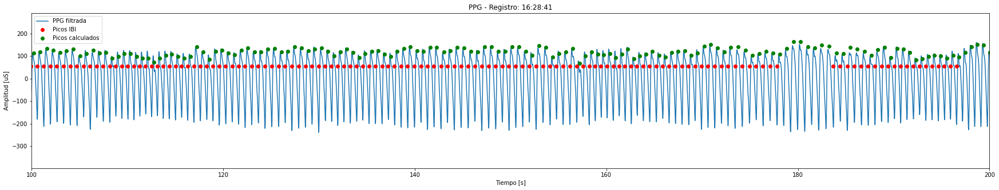

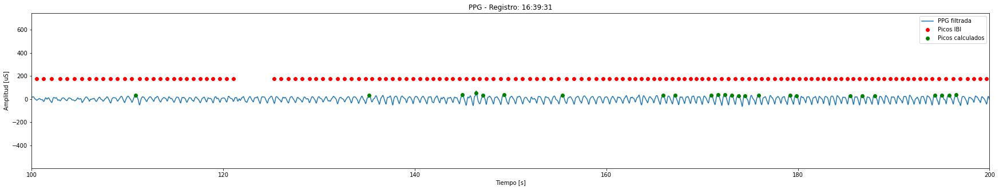

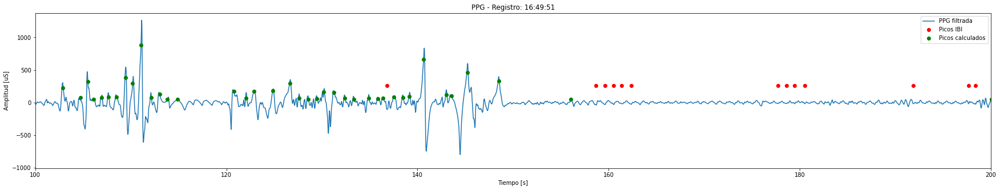

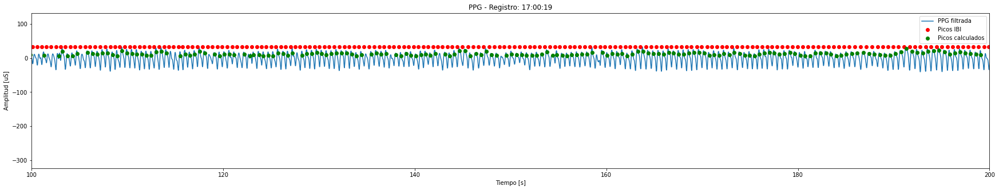

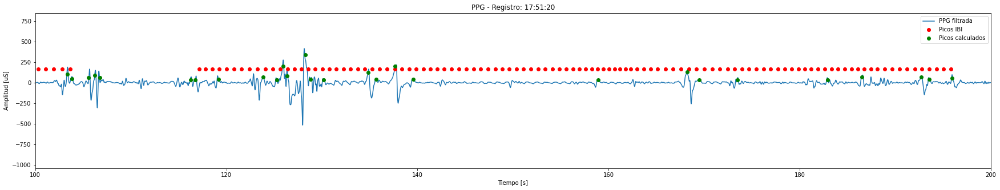

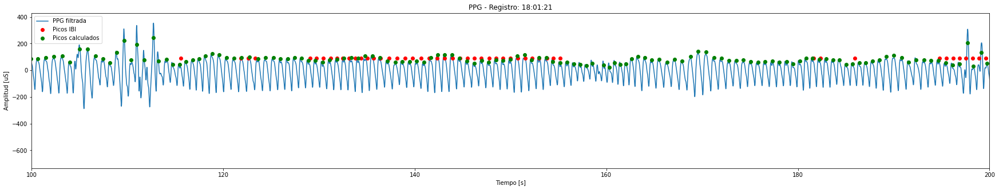

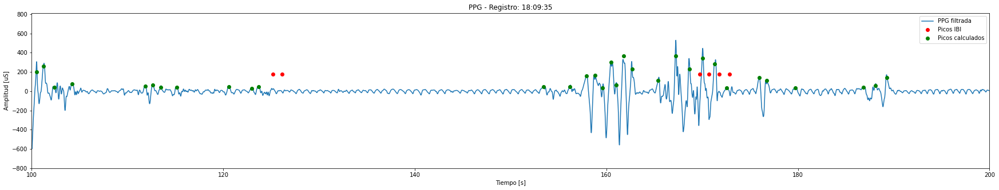

In [ ]:
for i in range(8):
  try:  
    x_ppg=np.ravel(PPG_filt1[i])
    x=np.repeat(0.3*max(x_ppg), len(IBI[i].values[:,0]))
    picos_ppg = find_peaks(x_ppg, distance=10, height=0.05*max(x_ppg))[0]
    plt.figure(figsize=(30,5))
    plt.plot(t_ppg[i], PPG[i], label='PPG filtrada')
    plt.plot(IBI[i].values[:,0], x, 'ro', label='Picos IBI')
    plt.plot(t_ppg[i][picos_ppg],x_ppg[picos_ppg], 'go', label='Picos calculados')
    plt.title('PPG - Registro: '+horario[i])
    plt.ylabel('Amplitud [uS]')
    plt.xlabel('Tiempo [s]')
    plt.legend()
    plt.xlim(100, 200)
    plt.show()
    print('\n')
  except:
    continue

Se incluyeron también dos gráficos de ejemplo del desarrollo en tiempo y frecuencia, según el periodograma de Lomb, para la HRV calculada y aquella dada por IBI.

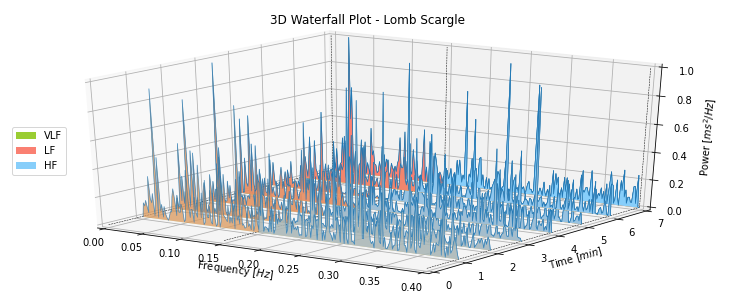

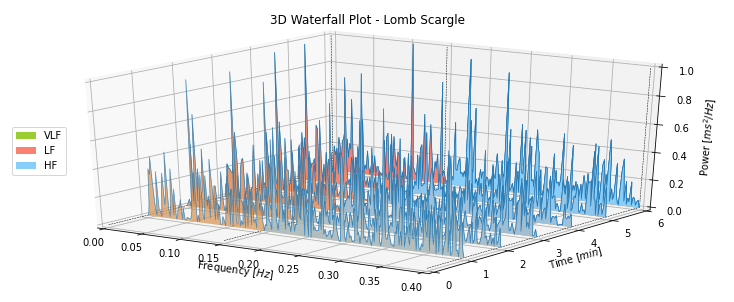

In [ ]:
fd.psd_waterfall(nni=nni_1[0], rpeaks=rpeaks[0], segments=None, method='lomb', fbands=fbands, duration=60, show=True);
fd.psd_waterfall(nni=IBI[0].values[:,1], rpeaks=IBI[0].values[:,0], segments=None, method='lomb', fbands=fbands, duration=60, show=True);

## Análisis espectral final

Finalmente, se realizan comparaciones entre los distintos espectros de las señales para la etapa basal y la de ansiedad.
En principio, se comparan los periodogramas de Lomb de la HRV:

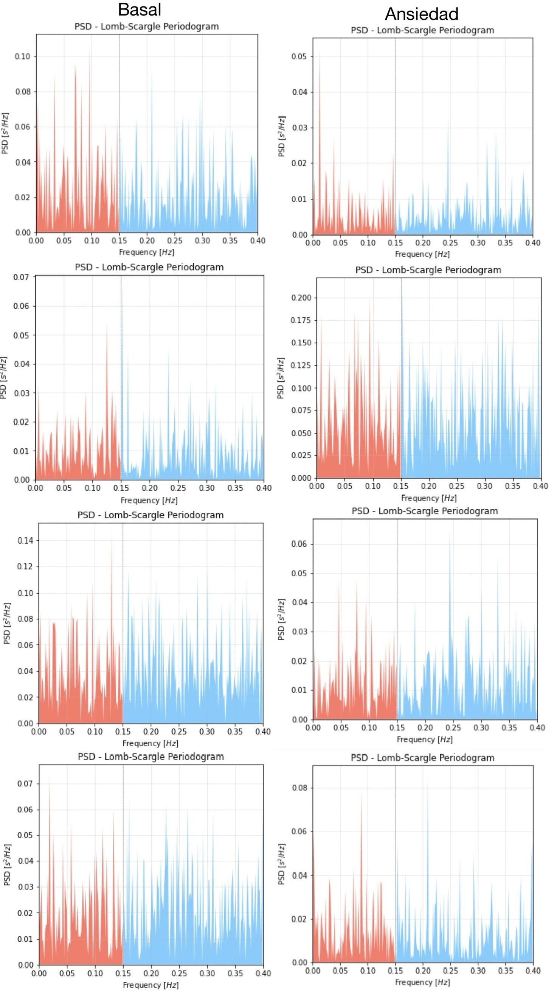

Resulta difícil establecer un patrón en cuanto a la densidad espectral de potencia de los dos estados, debido posiblemente al bajo número de registros tomados como también al posible ruido no filtrado con éxito.

Luego, se realizó un análisis espectral de las señales crudas, según el método de Welch.

In [ ]:
def sub_grafico(sig1, sig2, fs, lim, nombre, sen):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 5))
  for i in range(4):
    frec1, psd1 = welch(np.ravel(sig1[i].values), fs)
    frec2, psd2 = welch(np.ravel(sig2[i].values), fs)
    ax1.plot(frec1, psd1, label='Registro: '+sen[i])
    ax1.set_xlim((0, lim))
    ax1.set_title("Etapa Basal " + nombre)
    ax1.set_xlabel("Frecuencia")
    ax1.set_ylabel("PSD")
    ax1.legend()
    ax2.plot(frec2, psd2, label='Registro: '+sen[i+4])
    ax2.set_xlim((0, lim))
    ax2.set_title("Etapa de Ansiedad " + nombre)
    ax2.set_xlabel("Frecuencia")
    ax2.set_ylabel("PSD")
    ax2.legend()
  plt.show()

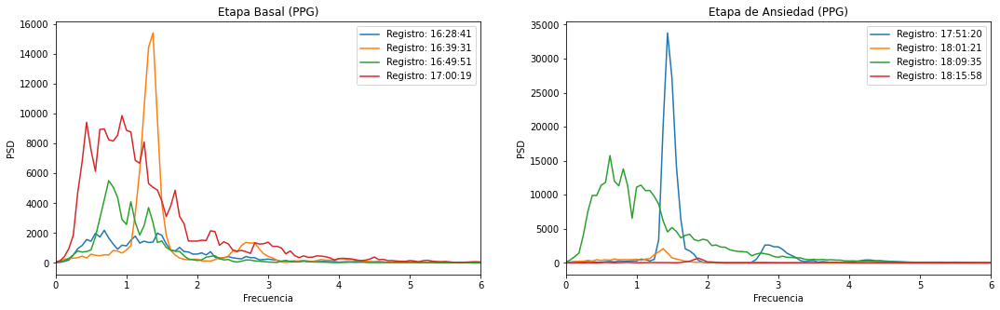

In [ ]:
sub_grafico(PPG_B, PPG_E, fs_ppg, 6, '(PPG)', horario)

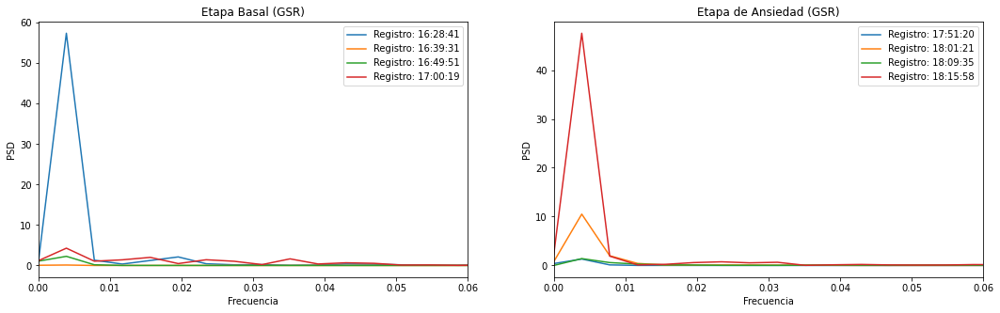

In [ ]:
sub_grafico(GSR_B, GSR_E, fs_gsr, 0.06, '(GSR)', horario)

## Conclusiones

A partir de los resultados analizados anteriormente, se puede ver que los valores de la variabilidad de la frecuencia cardíaca calculados internamente por el dispositivo (registros IBI) tienen mayor nivel de similitud con los resultados alcanzados con las señales de PPG previo al tratamiento de las mismas.

Por un lado, se debe tener en cuenta que en el caso de los registros de IBI, el dispositivo mismo descarta aquellos intervalos donde la señal es muy ruidosa o donde detectó movimiento excesivo a través del acelerómetro de la *wristband*. En cambio, esto no se tuvo en cuenta al identificar los latidos manualmente mediante la señal de PPG. Esto puede introducir mayor error, ya que se están incluyendo en el análisis secciones de la señal donde la componente de ruido es demasiado grande.

Finalmente, la frecuencia cardíaca calculada a partir de la señal filtrada puede resultar tan baja ya que esta señal se encuentra sobre filtrada. Si bien los filtros implementados son aquellos recomendados en la bibliografía, se puede notar que muchas de las ondulaciones se pierden luego de este proceso. Esto no necesariamente indica un problema con el tratamiento, sino que es posible que sea el adecuado para registros de grado médico.

## Referencias

* Bach, D.R.; Friston, K.J.; Dolan, R.J. *An improved  algorithm for model-based analysis of evoked skin conductance responses*. Biol. Psychol. 2013, 94, 490–497.
* Liang, Y.; Elgendi, M.; Chen, Z.; Ward, R. (Mayo, 2018). *An optimal filter for short photoplethysmogram signals*. Nature News. https://www.nature.com/articles/sdata201876#Sec4 